In [ ]:
import pandas as pd
import numpy as np
# 숫자 표현법 변경 (1e6 -> 소수점 2자리 실수형)
pd.set_option('display.float_format', '{:.2f}'.format)

# 1. 발전수요량 취합
# 출처 : 공공데이터포털(data.go.kr) > 한국거래소_시간별 제주전력수요
demand_1 = pd.read_csv("./raw data/한국전력거래소_시간별 제주전력수요_2017_2023.2.csv", encoding="EUC-KR")           # 2017~2023.2.
demand_2 = pd.read_csv("./raw data/한국전력거래소_시간별 제주전력수요_20230301-20230930.csv", encoding="EUC-KR")     # 2023.3.~2023.9.
demand_3 = pd.read_csv("./raw data/시간별 제주전력수요_240331.csv", encoding="EUC-KR")                              # 2023.9.~2024.3.
demand_4 = pd.read_csv("./raw data/시간별 제주전력수요_240630.csv", encoding="EUC-KR")                              # 2024.4.~2024.6.
demand_5 = pd.read_csv("./raw data/한국전력거래소_시간별 제주전력수요_20240930.csv", encoding="utf-8")               # 2024.7.~2024.9.
demand_1.shape,     # (2250,26)     : 마지막 불필요한 컬럼 삭제필요, 단위:kWh
demand_2.shape,     # (214,25)      : 2023.9.(1개월분 기간 겹침),   단위:kWh
demand_3.shape,     # (213,25)      : 2023.9.(1개월분 기간 겹침),   단위:MWh
demand_4.shape,     # (91,25)       : 단위:MWh
demand_5.shape      # (92,25)       : 단위:MWh

# 1) 불필요 컬럼 제거 (demand_1의 마지막 컬럼)
demand_1 = demand_1.iloc[:, :-1]
# 2) 단위 통일(kWh, Mwh -> kWh)
for col in demand_3.columns[1:]:
    demand_3[col] = demand_3[col]*1000
    demand_4[col] = demand_4[col]*1000
    demand_5[col] = demand_5[col]*1000
# 3) 컬럼명 통일(거래일자 -> 날짜)
demand_1 = demand_1.rename(columns={'거래일자' : '날짜'})
demand_2 = demand_2.rename(columns={'거래일자' : '날짜'})

# 4) 발전수요량 전체기간 합치기
demand = pd.concat([demand_1, demand_2, demand_3, demand_4, demand_5])

# 5) 컬럼명 변경 (기상자료의 시간 표시형식과 일치)
demand.columns = demand.columns.str.replace("시", ":00")
demand.columns = demand.columns.str.replace("24", "0")

# 6) 데이터 형태 변환 (melt)
value_var = demand.columns[1:]
demand_melted = pd.melt(demand, id_vars=['날짜'], value_vars=value_var, 
                        var_name="시간", value_name="발전수요량")

# 7) 컬럼 합치기, 시간순 정렬 및 중복 제거
demand_melted['일시']=demand_melted['날짜']+" "+demand_melted['시간']
demand_melted['일시']=pd.to_datetime(demand_melted['일시'])
demand_melted = demand_melted.sort_values('일시')
demand_melted = demand_melted.drop_duplicates('일시')

# 8) '일시' 및 '발전수요량' 컬럼만 추출
demand_result =pd.concat([demand_melted['일시'], demand_melted['발전수요량']], axis=1)

# 2. 기상자료 취합
# 출처 : 기상청 기상자료개방포털 > 데이터 > 기상관측 > 지상 > 자료
# 검색조건 : 지점 - 제주특별자치도 > 제주(184)
#           기간 - 20230101 00시 ~ 20231231 23시
#           기간 - 20240101 00시 ~ 20241222 23시
temp_23 = pd.read_csv("./raw data/OBS_ASOS_TIM_20241223162335.csv", encoding="EUC-KR")
temp_24 = pd.read_csv("./raw data/OBS_ASOS_TIM_20241223162031.csv", encoding="EUC-KR")

# 1) '일시' 자료형 변환 (object->datetime)
temp_23['일시'] = pd.to_datetime(temp_23['일시'])
temp_24['일시'] = pd.to_datetime(temp_24['일시'])

# 2) 기온데이터 병합
temperature = pd.concat([temp_23, temp_24])

# 3) 불필요 컬럼 제거
drop_col = [x for x in temperature.columns if ('지점' in x) or ('플래그' in x )  or ('약어' in x ) ]
temperature = temperature.drop(columns=drop_col)

# 3. 데이터 병합 (1.기상자료 x 2.발전수요량)
temp_demand = pd.merge(left=demand_result, right=temperature, how='inner', on='일시')

# 결측치 처리 ㅡ 0으로 대체
na_0_col = ['강수량(mm)','풍속(m/s)','풍향(16방위)','습도(%)','증기압(hPa)','이슬점온도(°C)','해면기압(hPa)','일조(hr)','일사(MJ/m2)','적설(cm)','3시간신적설(cm)','전운량(10분위)','중하층운량(10분위)','최저운고(100m )']
for col in na_0_col:
    temp_demand[col] = temp_demand[col].fillna(0)

# 결측 많은 컬럼 제거 (80%이상 결측인 컬럼)
temp_demand = temp_demand.dropna(thresh=(len(temp_demand)*0.8),axis=1)
temp_demand.isnull().sum()

# # 기온 결측치 제거
# temp_demand.dropna(subset='기온(°C)', inplace=True)
# temp_demand.isna().sum()

# 4. 컬럼 추가 : 휴일, 요일, 월, 시간
holidays = ['2023-01-01', '2023-01-21', '2023-01-22', '2023-01-23', '2023-01-24', 
            '2023-03-01', '2023-05-01', '2023-05-05', '2023-05-27', '2023-05-29', 
            '2023-06-06', '2023-08-15', '2023-09-28', '2023-09-29', '2023-09-30', 
            '2023-10-03', '2023-10-09', '2023-12-25', '2024-01-01', '2024-02-09', 
            '2024-02-10', '2024-02-11', '2024-02-12', '2024-03-01', '2024-04-10', 
            '2024-05-01', '2024-05-05', '2024-05-06', '2024-05-15', '2024-06-06', 
            '2024-08-15', '2024-09-16', '2024-09-17', '2024-09-18', '2024-10-03', 
            '2024-10-09', '2024-12-25']
temp_demand['day_of_week']=temp_demand['일시'].dt.dayofweek                                         # (5:토요일, 6:일요일)
temp_demand['holiday'] = np.where(temp_demand['일시'].dt.date.astype(str).isin(holidays), 1, 0)     # (1:휴일,  0:비휴일)
temp_demand['month'] = temp_demand['일시'].dt.month
temp_demand['hour'] = temp_demand['일시'].dt.hour
#   기온 - 정수값 컬럼 생성
temp_demand['temp_int'] = temp_demand['기온(°C)'].astype(int)
#   같은 정수 기온값들의 평균값 산출 
temp_demand['demand_mean'] = temp_demand.groupby('temp_int')['발전수요량'].transform('mean')
temp_demand.head(3)

# 5. 컬럼추가 : abs(기온 - 변곡점 온도)
gap_base = 19
temp_demand['temp_gap'] = abs(temp_demand['기온(°C)']-gap_base)
temp_demand['temp_surface_gap'] = abs(temp_demand['지면온도(°C)']-gap_base)
temp_demand['over_surface_gap_base'] = np.where(temp_demand['지면온도(°C)']>gap_base, 
                                                temp_demand['지면온도(°C)']-gap_base, 0)


# 6. 스케일 조정 : Min-Max
#   발전수요량, 기온(°C), 지면온도(°C), 일사(MJ/m2)
temp_demand['scaled_demand'] = (temp_demand['발전수요량'] - temp_demand['발전수요량'].min()) / (temp_demand['발전수요량'].max() - temp_demand['발전수요량'].min())
temp_demand['scaled_temp'] = (temp_demand['기온(°C)'] - temp_demand['기온(°C)'].min())/(temp_demand['기온(°C)'].max() - temp_demand['기온(°C)'].min())
temp_demand['scaled_temp_surface'] = (temp_demand['지면온도(°C)'] - temp_demand['지면온도(°C)'].min())/(temp_demand['지면온도(°C)'].max() - temp_demand['지면온도(°C)'].min())
temp_demand['scaled_insolation'] = (temp_demand['일사(MJ/m2)'] - temp_demand['일사(MJ/m2)'].min())/(temp_demand['일사(MJ/m2)'].max() - temp_demand['일사(MJ/m2)'].min())
#   기온갭(temp_gap), 지면온도갭(temp_surface_gap), 지면온도초과갭(over_surface_gap_base))
temp_demand['scaled_temp_gap'] = (temp_demand['temp_gap'] - temp_demand['temp_gap'].min())/(temp_demand['temp_gap'].max() - temp_demand['temp_gap'].min())
temp_demand['scaled_temp_surface_gap'] = (temp_demand['temp_surface_gap'] - temp_demand['temp_surface_gap'].min())/(temp_demand['temp_surface_gap'].max() - temp_demand['temp_surface_gap'].min())
temp_demand['scaled_temp_surface_overgap'] = (temp_demand['over_surface_gap_base'] - temp_demand['over_surface_gap_base'].min())/(temp_demand['over_surface_gap_base'].max() - temp_demand['over_surface_gap_base'].min())

# 7. 컬럼추가 : 수요량 - 기온갭
temp_demand['scaled_demand_wo_temp_gap'] = temp_demand['scaled_demand'] - temp_demand['temp_gap']
weight = 10
temp_demand['scaled_demand_wo_temp_n_surface_gap'] = temp_demand['scaled_demand'] - temp_demand['temp_gap'] + weight*temp_demand['scaled_temp_surface_gap']
temp_demand['scaled_demand_wo_temp_gap_n_insolation'] = temp_demand['scaled_demand'] - temp_demand['scaled_temp_gap'] - temp_demand['scaled_insolation']

temp_demand['sacled_demand_surface_over_gap_base'] = temp_demand['scaled_demand'] + temp_demand['scaled_temp_surface_overgap']


# 시각화 설정
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import font_manager
path =  'C:\\Windows\\Fonts\\NotoSansCJKkr-Regular.otf'
font = font_manager.FontProperties(fname=path).get_name()
plt.rc('font', family=font)


# # 5. CSV파일 생성 
# temp_demand.to_csv("./results/제주도 시간별 기상자료 및 발전수요량(20230101_20240930).csv", encoding='EUC-KR', index=False)

temp_demand.head(3).T

,0,1,2
일시,2023-01-01 00:00:00,2023-01-01 01:00:00,2023-01-01 02:00:00
발전수요량,792614.00,831297.00,791669.00
기온(°C),5.50,5.40,5.30
강수량(mm),0.00,0.00,0.00
풍속(m/s),2.80,2.50,3.00
풍향(16방위),230.00,230.00,230.00
습도(%),64.00,65.00,64.00
증기압(hPa),5.80,5.80,5.70
이슬점온도(°C),-0.70,-0.60,-0.90
현지기압(hPa),1030.00,1029.70,1029.50


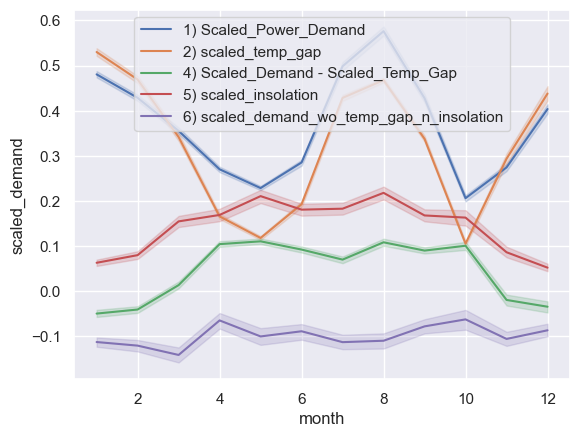

In [48]:
# 월별 수요량 패턴 분석
sns.set_theme(style='darkgrid')


sns.lineplot(data=temp_demand, x='month', y='scaled_demand', 
             label='1) Scaled_Power_Demand')
plt.legend()
sns.lineplot(data=temp_demand, x='month', y='scaled_temp_gap', 
             label='2) scaled_temp_gap')
plt.legend()
# sns.lineplot(data=temp_demand, x='month', y='scaled_temp_surface', 
#              label='3) scaled_temp_surface')
plt.legend()
gap = temp_demand['scaled_demand']-temp_demand['scaled_temp_gap']
sns.lineplot(data=temp_demand, x='month', y=gap, 
             label='4) Scaled_Demand - Scaled_Temp_Gap')
plt.legend()
sns.lineplot(data=temp_demand, x='month', y='scaled_insolation', 
             label='5) scaled_insolation')
plt.legend()
sns.lineplot(data=temp_demand, x='month', y='scaled_demand_wo_temp_gap_n_insolation', 
             label='6) scaled_demand_wo_temp_gap_n_insolation')
plt.legend()
# sns.lineplot(data=temp_demand, x='month', y=-temp_demand['scaled_temp_surface_gap'], 
#              label='7) 19도 기준 지면온도 차이(상하반전)')
# plt.legend()

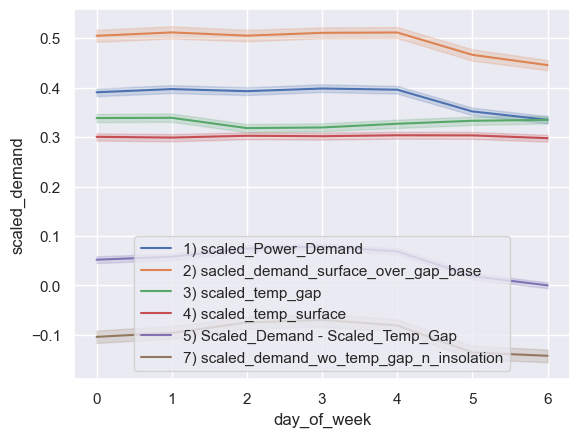

In [43]:
# 요일별 수요량 패턴 분석
sns.set_theme(style='darkgrid')


sns.lineplot(data=temp_demand, x='day_of_week', y='scaled_demand', 
             label='1) scaled_Power_Demand')
plt.legend()
sns.lineplot(data=temp_demand, x='day_of_week', y='sacled_demand_surface_over_gap_base', 
             label='2) sacled_demand_surface_over_gap_base')
plt.legend()
sns.lineplot(data=temp_demand, x='day_of_week', y='scaled_temp_gap', 
             label='3) scaled_temp_gap')
plt.legend()
sns.lineplot(data=temp_demand, x='day_of_week', y='scaled_temp_surface', 
             label='4) scaled_temp_surface')
plt.legend()
gap = temp_demand['scaled_demand']-temp_demand['scaled_temp_gap']
sns.lineplot(data=temp_demand, x='day_of_week', y=gap, 
             label='5) Scaled_Demand - Scaled_Temp_Gap')
plt.legend()
# sns.lineplot(data=temp_demand, x='hour', y='scaled_insolation', 
#              label='6) scaled_insolation')
# plt.legend()
sns.lineplot(data=temp_demand, x='day_of_week', y='scaled_demand_wo_temp_gap_n_insolation', 
             label='7) scaled_demand_wo_temp_gap_n_insolation')
plt.legend()
# sns.lineplot(data=temp_demand, x='hour', y=-temp_demand['scaled_temp_surface_gap'], 
#              label='8) 19도 기준 지면온도 차이(상하반전)')
# plt.legend()

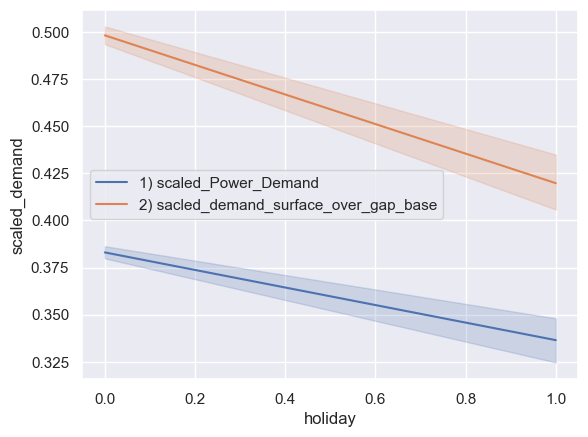

In [46]:
# 휴일여부에 따른 수요량 패턴 분석
sns.set_theme(style='darkgrid')

sns.lineplot(data=temp_demand, x='holiday', y='scaled_demand', 
             label='1) scaled_Power_Demand')
plt.legend()
sns.lineplot(data=temp_demand, x='holiday', y='sacled_demand_surface_over_gap_base', 
             label='2) sacled_demand_surface_over_gap_base')
plt.legend()

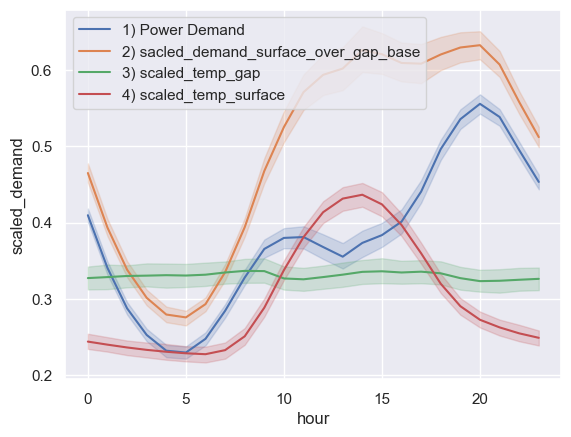

In [57]:
# 시간별 수요량 패턴 분석
sns.set_theme(style='darkgrid')


sns.lineplot(data=temp_demand, x='hour', y='scaled_demand', 
             label='1) Power Demand')
plt.legend()
sns.lineplot(data=temp_demand, x='hour', y='sacled_demand_surface_over_gap_base', 
             label='2) sacled_demand_surface_over_gap_base')
plt.legend()
sns.lineplot(data=temp_demand, x='hour', y='scaled_temp_gap', 
             label='3) scaled_temp_gap')
plt.legend()
sns.lineplot(data=temp_demand, x='hour', y='scaled_temp_surface', 
             label='4) scaled_temp_surface')
plt.legend()
# gap = temp_demand['scaled_demand']-temp_demand['scaled_temp_gap']
# sns.lineplot(data=temp_demand, x='hour', y=gap, 
#              label='5) Scaled_Demand - Scaled_Temp_Gap')
# plt.legend()
# sns.lineplot(data=temp_demand, x='hour', y='scaled_insolation', 
#              label='6) scaled_insolation')
# plt.legend()
# sns.lineplot(data=temp_demand, x='hour', y='scaled_demand_wo_temp_gap_n_insolation', 
#              label='7) scaled_demand_wo_temp_gap_n_insolation')
# plt.legend()
# sns.lineplot(data=temp_demand, x='hour', y=-temp_demand['scaled_temp_surface_gap'], 
#              label='8) 19도 기준 지면온도 차이(상하반전)')
# plt.legend()

c:\Users\praye\anaconda3\envs\kdt_energy1_1\Lib\site-packages\seaborn\utils.py:61: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from font(s) KoPubDotum Light.
  fig.canvas.draw()


c:\Users\praye\anaconda3\envs\kdt_energy1_1\Lib\site-packages\IPython\core\events.py:82: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from font(s) KoPubDotum Light.
  func(*args, **kwargs)
c:\Users\praye\anaconda3\envs\kdt_energy1_1\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from font(s) KoPubDotum Light.
  fig.canvas.print_figure(bytes_io, **kw)


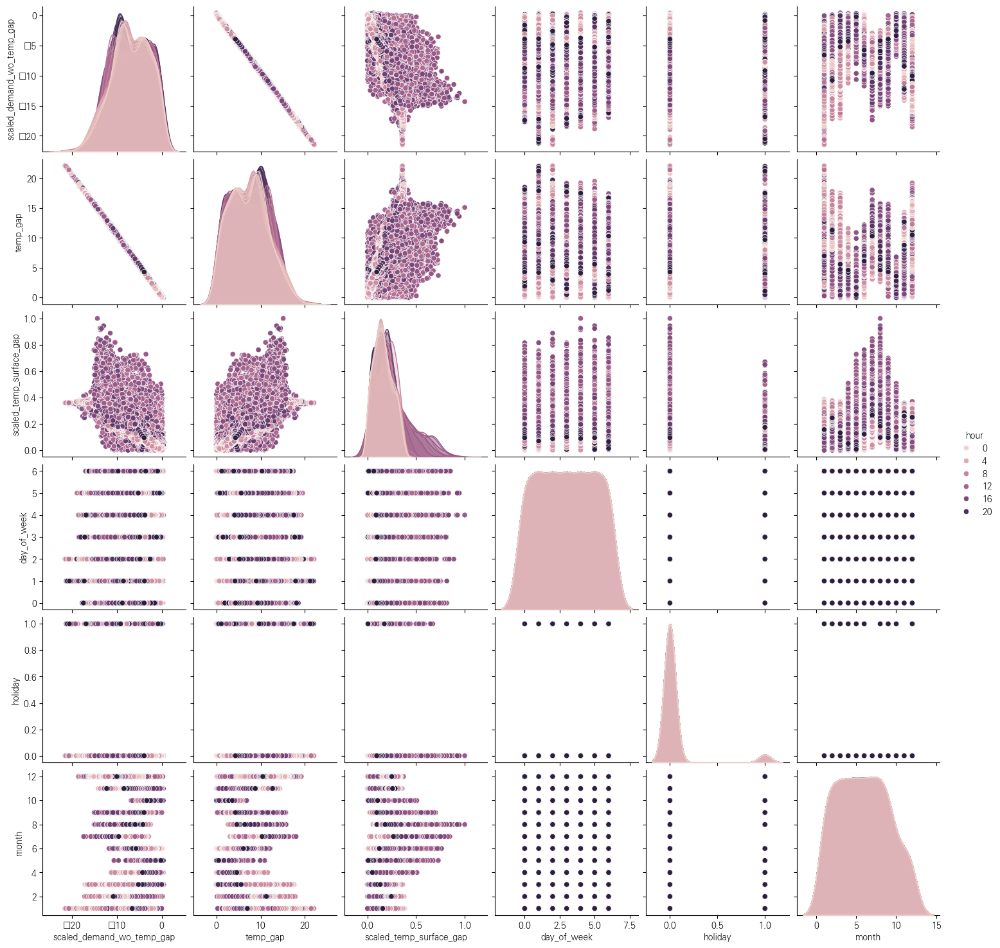

In [9]:
cols=['scaled_demand_wo_temp_gap', 'temp_gap', 'scaled_temp_surface_gap', 'day_of_week','holiday', 'hour', 'month']
sns.pairplot(temp_demand[cols], hue='hour')


c:\Users\praye\anaconda3\envs\kdt_energy1_1\Lib\site-packages\seaborn\axisgrid.py:123: UserWarning: Glyph 48156 (\N{HANGUL SYLLABLE BAL}) missing from font(s) Arial.
  self._figure.tight_layout(*args, **kwargs)
c:\Users\praye\anaconda3\envs\kdt_energy1_1\Lib\site-packages\seaborn\axisgrid.py:123: UserWarning: Glyph 51204 (\N{HANGUL SYLLABLE JEON}) missing from font(s) Arial.
  self._figure.tight_layout(*args, **kwargs)
c:\Users\praye\anaconda3\envs\kdt_energy1_1\Lib\site-packages\seaborn\axisgrid.py:123: UserWarning: Glyph 49688 (\N{HANGUL SYLLABLE SU}) missing from font(s) Arial.
  self._figure.tight_layout(*args, **kwargs)
c:\Users\praye\anaconda3\envs\kdt_energy1_1\Lib\site-packages\seaborn\axisgrid.py:123: UserWarning: Glyph 50836 (\N{HANGUL SYLLABLE YO}) missing from font(s) Arial.
  self._figure.tight_layout(*args, **kwargs)
c:\Users\praye\anaconda3\envs\kdt_energy1_1\Lib\site-packages\seaborn\axisgrid.py:123: UserWarning: Glyph 47049 (\N{HANGUL SYLLABLE RYANG}) missing from font

c:\Users\praye\anaconda3\envs\kdt_energy1_1\Lib\site-packages\IPython\core\events.py:82: UserWarning: Glyph 48156 (\N{HANGUL SYLLABLE BAL}) missing from font(s) Arial.
  func(*args, **kwargs)
c:\Users\praye\anaconda3\envs\kdt_energy1_1\Lib\site-packages\IPython\core\events.py:82: UserWarning: Glyph 51204 (\N{HANGUL SYLLABLE JEON}) missing from font(s) Arial.
  func(*args, **kwargs)
c:\Users\praye\anaconda3\envs\kdt_energy1_1\Lib\site-packages\IPython\core\events.py:82: UserWarning: Glyph 49688 (\N{HANGUL SYLLABLE SU}) missing from font(s) Arial.
  func(*args, **kwargs)
c:\Users\praye\anaconda3\envs\kdt_energy1_1\Lib\site-packages\IPython\core\events.py:82: UserWarning: Glyph 50836 (\N{HANGUL SYLLABLE YO}) missing from font(s) Arial.
  func(*args, **kwargs)
c:\Users\praye\anaconda3\envs\kdt_energy1_1\Lib\site-packages\IPython\core\events.py:82: UserWarning: Glyph 47049 (\N{HANGUL SYLLABLE RYANG}) missing from font(s) Arial.
  func(*args, **kwargs)
c:\Users\praye\anaconda3\envs\kdt_energ

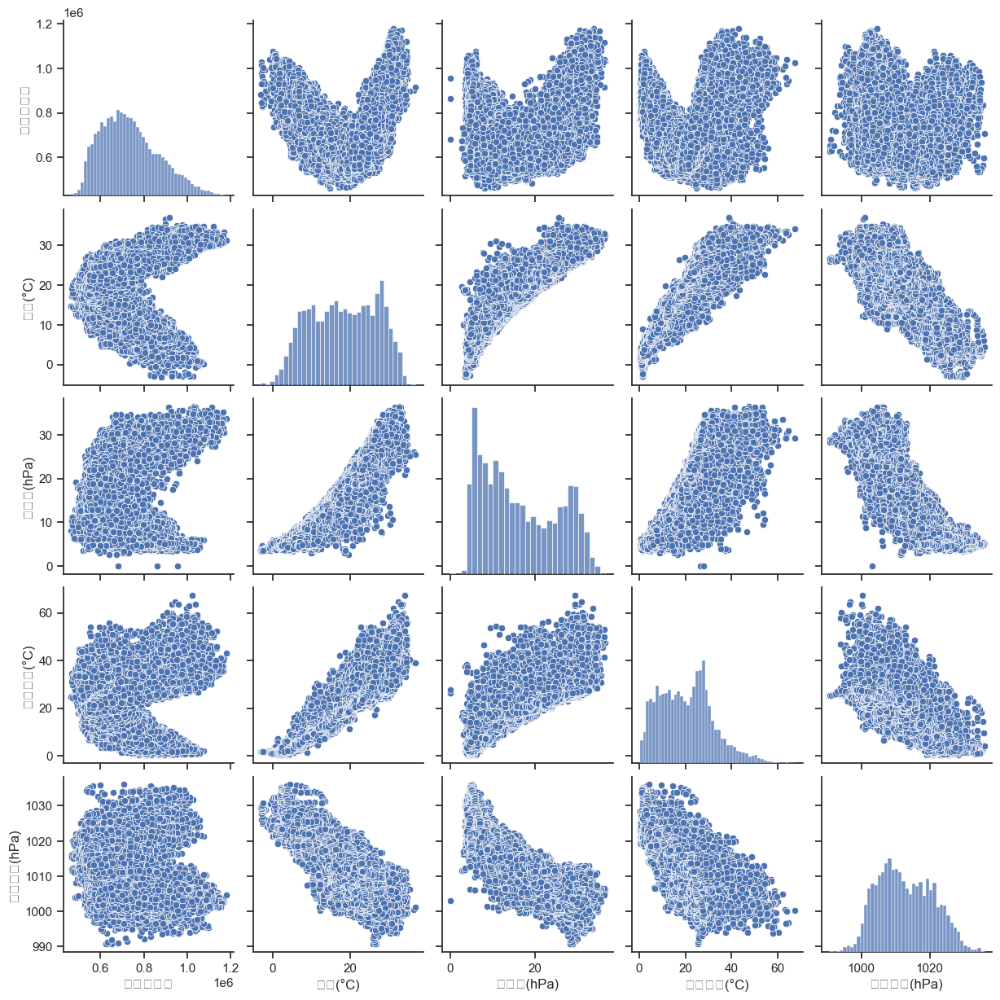

In [13]:

# pairplot
sns.set_theme(style='ticks')
cols=['발전수요량', '기온(°C)', '증기압(hPa)', '지면온도(°C)', '현지기압(hPa)']
sns.pairplot(temp_demand[cols])



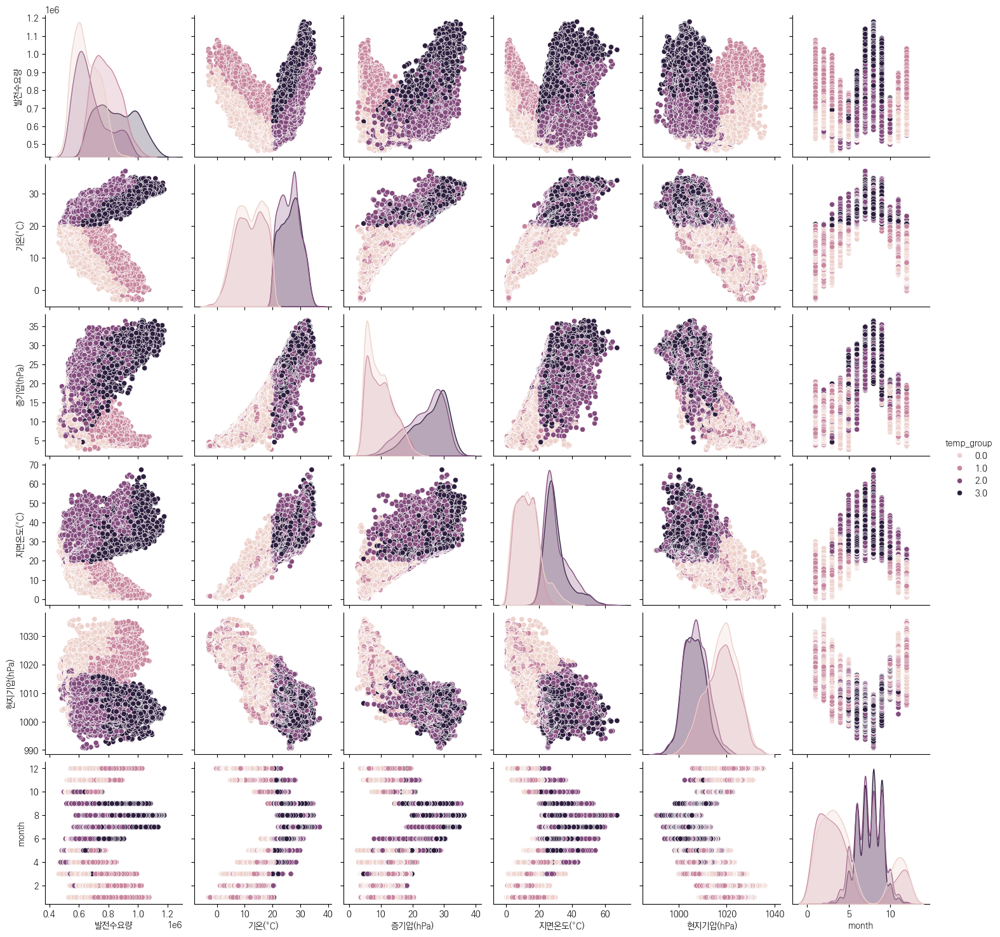

In [54]:
# 
cols=['발전수요량', '기온(°C)', '증기압(hPa)', '지면온도(°C)', '현지기압(hPa)', 'temp_group', 'month']
sns.pairplot(temp_demand[cols], hue='temp_group')


In [62]:
import pandas as pd
df_pivot = temp_demand[cols].pivot(index='month', columns='temp_group', values='발전수요량')
df_pivot

ValueError: Index contains duplicate entries, cannot reshape

In [68]:
temp_demand[cols].groupby(['month', 'temp_group']).count()



발전수요량  기온(°C)  증기압(hPa)  지면온도(°C)  현지기압(hPa)
month temp_group                                              
1     0.0           652     652       652       652        652
      1.0           834     834       834       834        834
      2.0             1       1         1         1          1
      3.0             1       1         1         1          1
2     0.0           662     662       662       662        662
      1.0           698     698       698       698        698
      2.0             4       4         4         4          4
      3.0             4       4         4         4          4
3     0.0           802     802       802       802        802
      1.0           659     659       659       659        659
      2.0            19      19        19        19         19
      3.0             8       8         8         8          8
4     0.0           692     692       692       688        692
      1.0           617     617       617       614        617
      2.0            91      91        91        90         91
      3.0            40      40        40        40         40
5     0.0           557     557       557       549        557
      1.0           378     378       378       372        378
      2.0           362     362       362       352        362
      3.0           191     191       191       189        191
6     0.0           159     159       159       159        159
      1.0            66      66        66        66         66
      2.0           633     633       633       623        633
      3.0           580     580       580       573        580
7     2.0           803     803       803       803        803
      3.0           685     685       685       685        685
8     2.0           709     709       709       709        709
      3.0           778     778       778       778        778
9     0.0             1       1         1         1          1
      1.0             3       3         3         3          3
      2.0           718     718       718       718        718
      3.0           718     718       718       718        718
10    0.0           264     264       264       264        264
      1.0           147     147       147       147        147
      2.0           216     216       216       216        216
      3.0           117     117       117       117        117
11    0.0           419     419       419       419        419
      1.0           205     205       205       205        205
      2.0            61      61        61        61         61
      3.0            35      35        35        35         35
12    0.0           351     351       351       351        351
      1.0           373     373       373       373        373
      2.0            12      12        12        12         12
      3.0             8       8         8         8          8

In [150]:
temp_demand.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15336 entries, 0 to 15335
Data columns (total 36 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   일시                         15336 non-null  datetime64[ns]
 1   발전수요량                      15336 non-null  float64       
 2   기온(°C)                     15333 non-null  float64       
 3   강수량(mm)                    2036 non-null   float64       
 4   풍속(m/s)                    15318 non-null  float64       
 5   풍향(16방위)                   15318 non-null  float64       
 6   습도(%)                      15333 non-null  float64       
 7   증기압(hPa)                   15333 non-null  float64       
 8   이슬점온도(°C)                  15333 non-null  float64       
 9   현지기압(hPa)                  15334 non-null  float64       
 10  해면기압(hPa)                  15334 non-null  float64       
 11  일조(hr)                     8429 non-null   float64       
 12  일사(M

c:\Users\praye\anaconda3\envs\kdt_energy1_1\Lib\site-packages\IPython\core\events.py:82: UserWarning: Glyph 51068 (\N{HANGUL SYLLABLE IL}) missing from font(s) Arial.
  func(*args, **kwargs)
c:\Users\praye\anaconda3\envs\kdt_energy1_1\Lib\site-packages\IPython\core\events.py:82: UserWarning: Glyph 49884 (\N{HANGUL SYLLABLE SI}) missing from font(s) Arial.
  func(*args, **kwargs)
c:\Users\praye\anaconda3\envs\kdt_energy1_1\Lib\site-packages\IPython\core\events.py:82: UserWarning: Glyph 48156 (\N{HANGUL SYLLABLE BAL}) missing from font(s) Arial.
  func(*args, **kwargs)
c:\Users\praye\anaconda3\envs\kdt_energy1_1\Lib\site-packages\IPython\core\events.py:82: UserWarning: Glyph 51204 (\N{HANGUL SYLLABLE JEON}) missing from font(s) Arial.
  func(*args, **kwargs)
c:\Users\praye\anaconda3\envs\kdt_energy1_1\Lib\site-packages\IPython\core\events.py:82: UserWarning: Glyph 49688 (\N{HANGUL SYLLABLE SU}) missing from font(s) Arial.
  func(*args, **kwargs)
c:\Users\praye\anaconda3\envs\kdt_energy1_

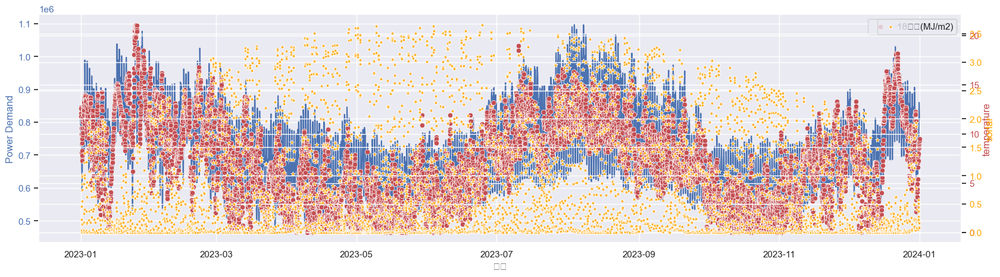

In [128]:
# 발전수요량 선 차트(시간단위)
sns.set_theme(style='darkgrid')
fig, ax1 = plt.subplots(figsize=(20,5))

# 첫 번째 y축: 수요량 (라인 차트) 
sns.lineplot(x='일시', y='발전수요량', data=temp_demand[temp_demand['일시']<'2024-01-01 00:00'], 
             ax=ax1, label='발전수요량', color='b') 
ax1.set_ylabel('Power Demand', color='b') 
ax1.tick_params(axis='y', labelcolor='b')

# 두 번째 y축: 온도 (산점도) 
ax2 = ax1.twinx() 
sns.scatterplot(x='일시', y='temp_gap', data=temp_demand[temp_demand['일시']<'2024-01-01 00:00'], 
                ax=ax2, label='18도 대비 온도갭', color='r', marker='o') 
ax2.set_ylabel('temperature_gap', color='r') 
ax2.tick_params(axis='y', labelcolor='r')


ax3 = ax1.twinx() 
sns.scatterplot(x='일시', y='일사(MJ/m2)', data=temp_demand[temp_demand['일시']<'2024-01-01 00:00'], 
                ax=ax3, label='일사(MJ/m2)', color='orange', marker='*') 
ax3.set_ylabel('sorlar', color='orange') 
ax3.tick_params(axis='y', labelcolor='orange')


c:\Users\praye\anaconda3\envs\kdt_energy1_1\Lib\site-packages\IPython\core\events.py:82: UserWarning: Glyph 51068 (\N{HANGUL SYLLABLE IL}) missing from font(s) Arial.
  func(*args, **kwargs)
c:\Users\praye\anaconda3\envs\kdt_energy1_1\Lib\site-packages\IPython\core\events.py:82: UserWarning: Glyph 49884 (\N{HANGUL SYLLABLE SI}) missing from font(s) Arial.
  func(*args, **kwargs)
c:\Users\praye\anaconda3\envs\kdt_energy1_1\Lib\site-packages\IPython\core\events.py:82: UserWarning: Glyph 48156 (\N{HANGUL SYLLABLE BAL}) missing from font(s) Arial.
  func(*args, **kwargs)
c:\Users\praye\anaconda3\envs\kdt_energy1_1\Lib\site-packages\IPython\core\events.py:82: UserWarning: Glyph 51204 (\N{HANGUL SYLLABLE JEON}) missing from font(s) Arial.
  func(*args, **kwargs)
c:\Users\praye\anaconda3\envs\kdt_energy1_1\Lib\site-packages\IPython\core\events.py:82: UserWarning: Glyph 49688 (\N{HANGUL SYLLABLE SU}) missing from font(s) Arial.
  func(*args, **kwargs)
c:\Users\praye\anaconda3\envs\kdt_energy1_

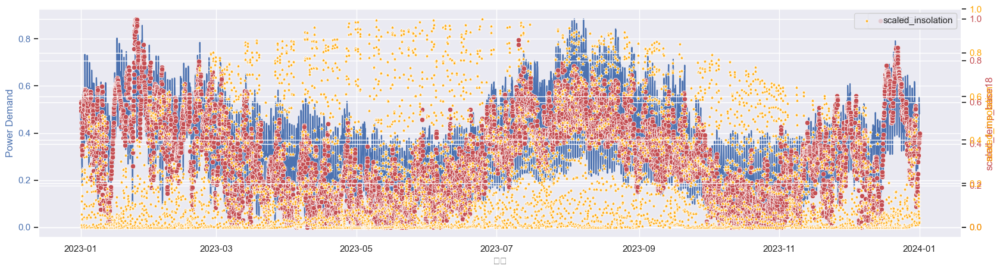

In [130]:
# 발전수요량 선 차트(시간단위)
sns.set_theme(style='darkgrid')
fig, ax1 = plt.subplots(figsize=(20,5))

# 첫 번째 y축: 수요량 (라인 차트) 
sns.lineplot(x='일시', y='scaled_demand', data=temp_demand[temp_demand['일시']<'2024-01-01 00:00'], 
             ax=ax1, label='발전수요량', color='b') 
ax1.set_ylabel('Power Demand', color='b') 
ax1.tick_params(axis='y', labelcolor='b')

# 두 번째 y축: 온도 (산점도) 
ax2 = ax1.twinx() 
sns.scatterplot(x='일시', y='temp_gap', data=temp_demand[temp_demand['일시']<'2024-01-01 00:00'], 
                ax=ax2, label='temp_gap', color='r', marker='o') 
ax2.set_ylabel('temp_gap', color='r') 
ax2.tick_params(axis='y', labelcolor='r')


ax3 = ax1.twinx() 
sns.scatterplot(x='일시', y='scaled_insolation', data=temp_demand[temp_demand['일시']<'2024-01-01 00:00'], 
                ax=ax3, label='scaled_insolation', color='orange', marker='*') 
ax3.set_ylabel('scaled_insolation', color='orange') 
ax3.tick_params(axis='y', labelcolor='orange')


In [154]:
temp_demand.head(3).T

,0,1,2
일시,2023-01-01 00:00:00,2023-01-01 01:00:00,2023-01-01 02:00:00
발전수요량,792614.00,831297.00,791669.00
기온(°C),5.50,5.40,5.30
강수량(mm),NaN,NaN,NaN
풍속(m/s),2.80,2.50,3.00
풍향(16방위),230.00,230.00,230.00
습도(%),64.00,65.00,64.00
증기압(hPa),5.80,5.80,5.70
이슬점온도(°C),-0.70,-0.60,-0.90
현지기압(hPa),1030.00,1029.70,1029.50


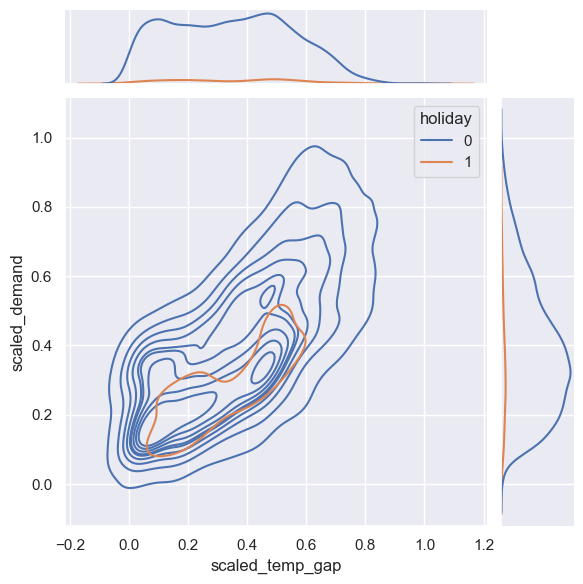

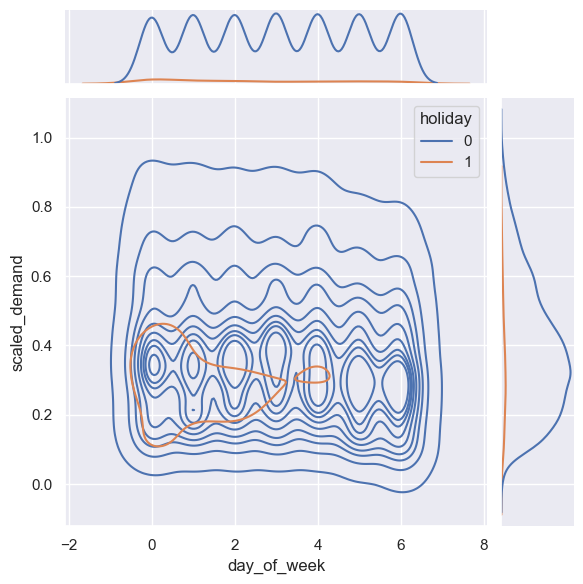

In [155]:
sns.jointplot(data=temp_demand, kind='kde',
              x='scaled_temp_gap', y='scaled_demand', hue='holiday'),
sns.jointplot(data=temp_demand, kind='kde',
              x='day_of_week', y='scaled_demand', hue='holiday')

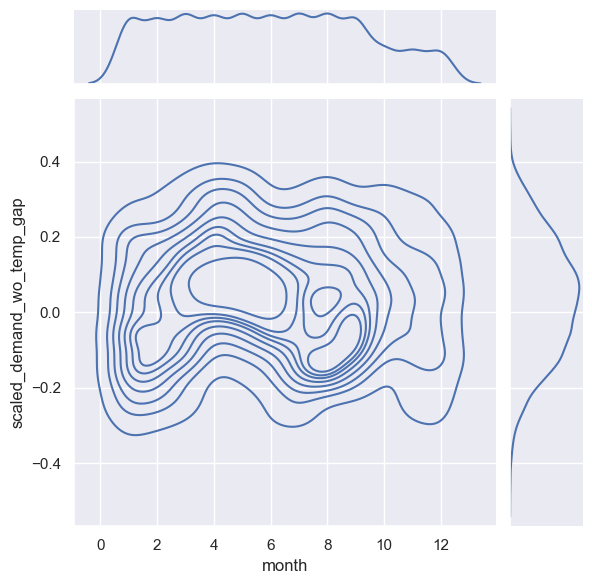

In [149]:
sns.jointplot(data=temp_demand, kind='kde',
              x='month', y='scaled_demand_wo_temp_gap')

In [ ]:
sns.lineplot(x='일시', y='scaled_demand_wo_temp_gap', hue='day_of_week')

c:\Users\praye\anaconda3\envs\kdt_energy1_1\Lib\site-packages\seaborn\utils.py:61: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from font(s) KoPubDotum Light.
  fig.canvas.draw()


c:\Users\praye\anaconda3\envs\kdt_energy1_1\Lib\site-packages\IPython\core\events.py:82: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from font(s) KoPubDotum Light.
  func(*args, **kwargs)
c:\Users\praye\anaconda3\envs\kdt_energy1_1\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from font(s) KoPubDotum Light.
  fig.canvas.print_figure(bytes_io, **kw)


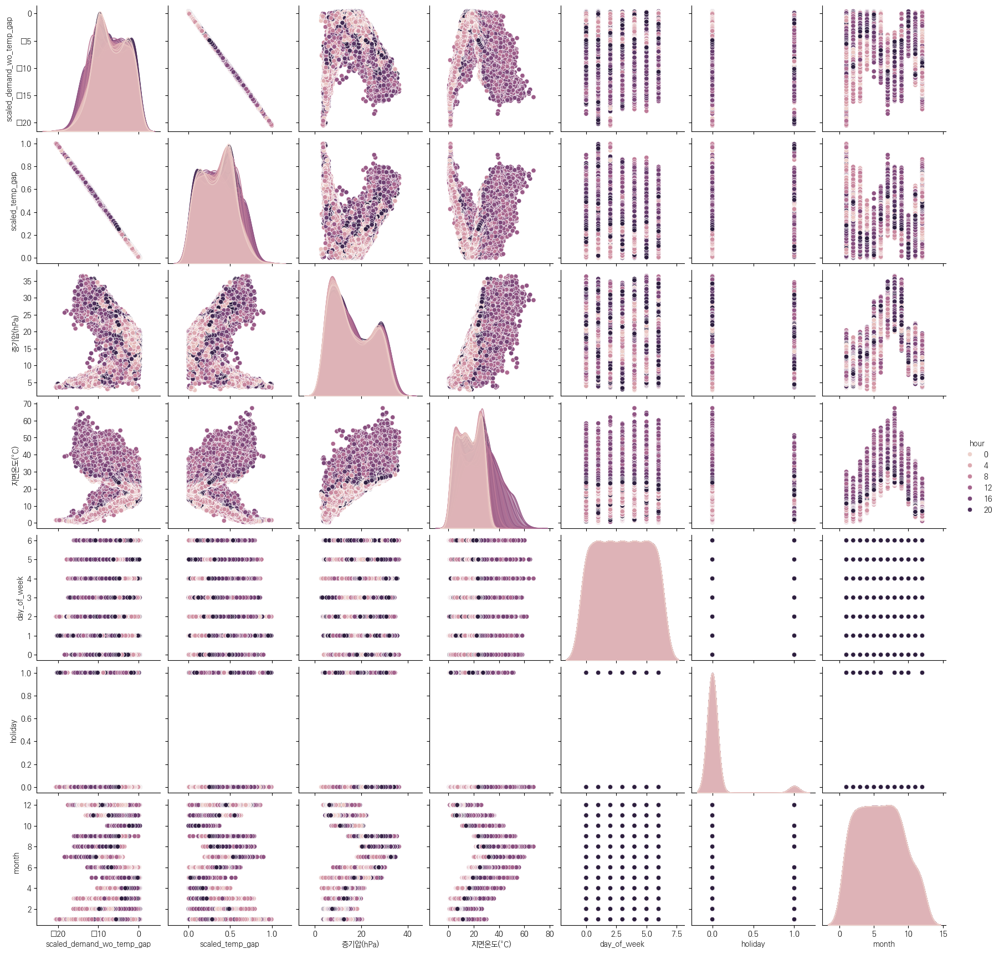

In [ ]:
cols=['scaled_demand_wo_temp_gap', 'temp_gap', '증기압(hPa)', '지면온도(°C)', 'day_of_week','holiday', 'hour', 'month']
sns.pairplot(temp_demand[cols], hue='hour')


In [33]:
# 기온 세분화_2 _ 중앙값 이용 
# 기온 - 정수값 컬럼 생성
temp_demand['temp_int'] = temp_demand['기온(°C)'].astype(int)

# 같은 정수 기온값들의 중앙값 산출 
temp_demand['demand_median'] = temp_demand.groupby('temp_int')['발전수요량'].transform('median')
temp_demand.head(3).T

,0,1,2
일시,2023-01-01 00:00:00,2023-01-01 01:00:00,2023-01-01 02:00:00
발전수요량,792614.0,831297.0,791669.0
기온(°C),5.5,5.4,5.3
강수량(mm),0.0,0.0,0.0
풍속(m/s),2.8,2.5,3.0
풍향(16방위),230.0,230.0,230.0
습도(%),64.0,65.0,64.0
증기압(hPa),5.8,5.8,5.7
이슬점온도(°C),-0.7,-0.6,-0.9
현지기압(hPa),1030.0,1029.7,1029.5


In [34]:
# 기온 groupping  (0:20이하&중앙값이하, 1:20이하&중앙값초과 2:20초과&중앙값이하, 3:20초과&중앙값초과)
import numpy as np
conditions_med = [ (temp_demand['기온(°C)'] <= 20) & (temp_demand['발전수요량'] <= temp_demand['demand_median']), 
              (temp_demand['기온(°C)'] <= 20) & (temp_demand['발전수요량'] > temp_demand['demand_median']), 
              (temp_demand['기온(°C)'] > 20) & (temp_demand['발전수요량'] <= temp_demand['demand_median']), 
              (temp_demand['기온(°C)'] > 20) & (temp_demand['발전수요량'] > temp_demand['demand_median']) ]
choices = [0, 1, 2, 3]
temp_demand['temp_group_2'] = np.select(conditions_med, choices, default=np.nan)
temp_demand.head(3)

,일시,발전수요량,기온(°C),강수량(mm),풍속(m/s),풍향(16방위),습도(%),증기압(hPa),이슬점온도(°C),현지기압(hPa),...,지면온도(°C),5cm 지중온도(°C),10cm 지중온도(°C),20cm 지중온도(°C),30cm 지중온도(°C),temp_int,demand_mean,temp_group,demand_median,temp_group_2
0,2023-01-01 00:00:00,792614.0,5.5,0.0,2.8,230.0,64.0,5.8,-0.7,1030.0,...,3.7,7.8,7.8,8.3,7.4,5,813042.841954,0.0,798538.0,0.0
1,2023-01-01 01:00:00,831297.0,5.4,0.0,2.5,230.0,65.0,5.8,-0.6,1029.7,...,3.3,7.5,7.6,8.2,7.4,5,813042.841954,1.0,798538.0,1.0
2,2023-01-01 02:00:00,791669.0,5.3,0.0,3.0,230.0,64.0,5.7,-0.9,1029.5,...,3.0,7.3,7.4,8.1,7.4,5,813042.841954,0.0,798538.0,0.0


In [40]:
temp_demand['hour'] = temp_demand['일시'].dt.hour
temp_demand['month'] = temp_demand['일시'].dt.month


In [41]:
# 시간 groupping (0:0~7 / 1:7~9 / 2:9~13 / 3:13~20 / 4:20~23)
import numpy as np
conditions_hour = [ (temp_demand['hour'] <= 7), 
                  (temp_demand['hour'] <= 9), 
                  (temp_demand['hour'] <= 13), 
                  (temp_demand['hour'] <= 20), 
                  (temp_demand['hour'] <= 23) ]
choices_hour = [0, 1, 2, 3, 4]
temp_demand['hour_group'] = np.select(conditions_hour, choices_hour, default=np.nan)
temp_demand.head(3)

,일시,발전수요량,기온(°C),강수량(mm),풍속(m/s),풍향(16방위),습도(%),증기압(hPa),이슬점온도(°C),현지기압(hPa),...,20cm 지중온도(°C),30cm 지중온도(°C),temp_int,demand_mean,temp_group,demand_median,temp_group_2,hour,month,hour_group
0,2023-01-01 00:00:00,792614.0,5.5,0.0,2.8,230.0,64.0,5.8,-0.7,1030.0,...,8.3,7.4,5,813042.841954,0.0,798538.0,0.0,0,1,0.0
1,2023-01-01 01:00:00,831297.0,5.4,0.0,2.5,230.0,65.0,5.8,-0.6,1029.7,...,8.2,7.4,5,813042.841954,1.0,798538.0,1.0,1,1,0.0
2,2023-01-01 02:00:00,791669.0,5.3,0.0,3.0,230.0,64.0,5.7,-0.9,1029.5,...,8.1,7.4,5,813042.841954,0.0,798538.0,0.0,2,1,0.0


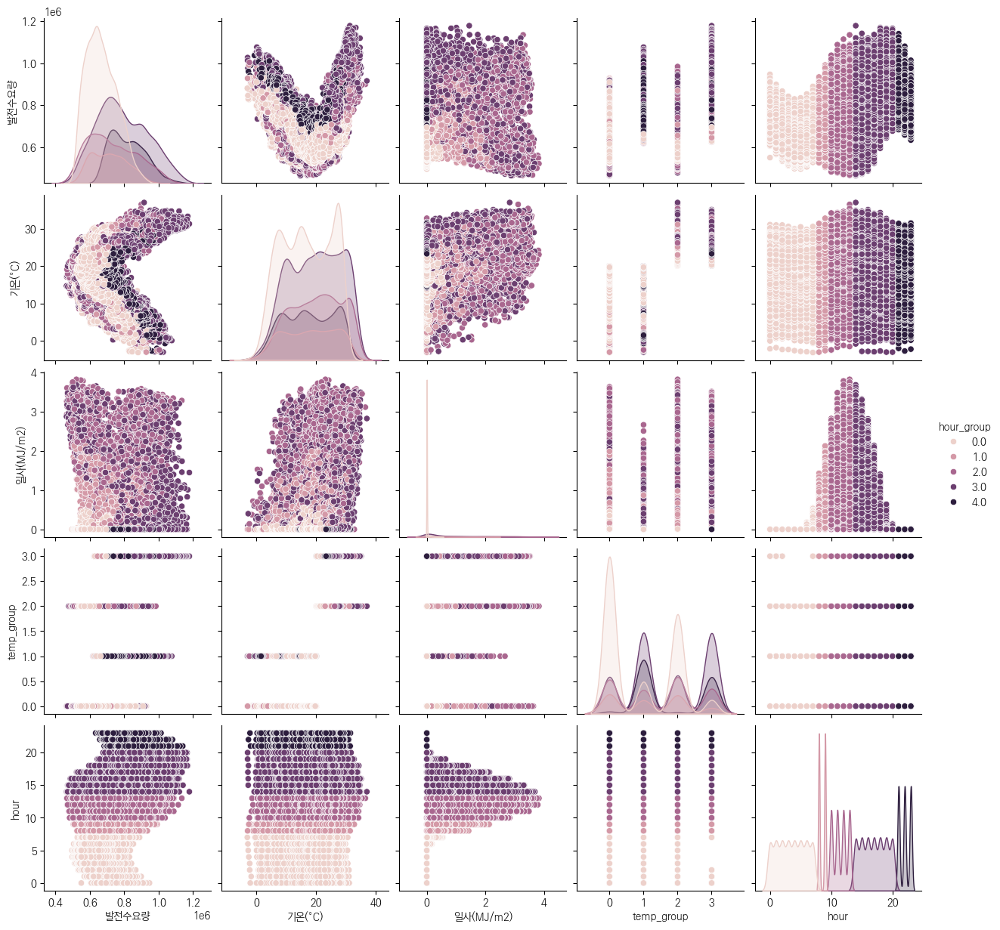

In [46]:
# lineplot w/ median 
cols=['발전수요량', '기온(°C)', '일사(MJ/m2)', 'temp_group', 'hour_group', 'hour']
sns.pairplot(temp_demand[cols], hue='hour_group')


In [23]:
temp_demand.info()

<class 'pandas.core.frame.DataFrame'>
Index: 15333 entries, 0 to 15335
Data columns (total 29 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   일시             15333 non-null  datetime64[ns]
 1   발전수요량          15333 non-null  float64       
 2   기온(°C)         15333 non-null  float64       
 3   강수량(mm)        15333 non-null  float64       
 4   풍속(m/s)        15333 non-null  float64       
 5   풍향(16방위)       15333 non-null  float64       
 6   습도(%)          15333 non-null  float64       
 7   증기압(hPa)       15333 non-null  float64       
 8   이슬점온도(°C)      15333 non-null  float64       
 9   현지기압(hPa)      15333 non-null  float64       
 10  해면기압(hPa)      15333 non-null  float64       
 11  일조(hr)         15333 non-null  float64       
 12  일사(MJ/m2)      15333 non-null  float64       
 13  적설(cm)         15333 non-null  float64       
 14  3시간신적설(cm)     15333 non-null  float64       
 15  전운량(10분위)      15333 non

In [36]:
# pd.set_option("display_max_columns", None)
temp_demand.columns,
temp_demand.head(3).T


,0,1,2
일시,2023-01-01 00:00:00,2023-01-01 01:00:00,2023-01-01 02:00:00
발전수요량,792614.0,831297.0,791669.0
기온(°C),5.5,5.4,5.3
강수량(mm),0.0,0.0,0.0
풍속(m/s),2.8,2.5,3.0
풍향(16방위),230.0,230.0,230.0
습도(%),64.0,65.0,64.0
증기압(hPa),5.8,5.8,5.7
이슬점온도(°C),-0.7,-0.6,-0.9
현지기압(hPa),1030.0,1029.7,1029.5


c:\Users\praye\anaconda3\envs\kdt_energy1_1\Lib\site-packages\seaborn\utils.py:61: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from font(s) KoPubDotum Light.
  fig.canvas.draw()


<Axes: >

c:\Users\praye\anaconda3\envs\kdt_energy1_1\Lib\site-packages\IPython\core\events.py:82: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from font(s) KoPubDotum Light.
  func(*args, **kwargs)
c:\Users\praye\anaconda3\envs\kdt_energy1_1\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from font(s) KoPubDotum Light.
  fig.canvas.print_figure(bytes_io, **kw)


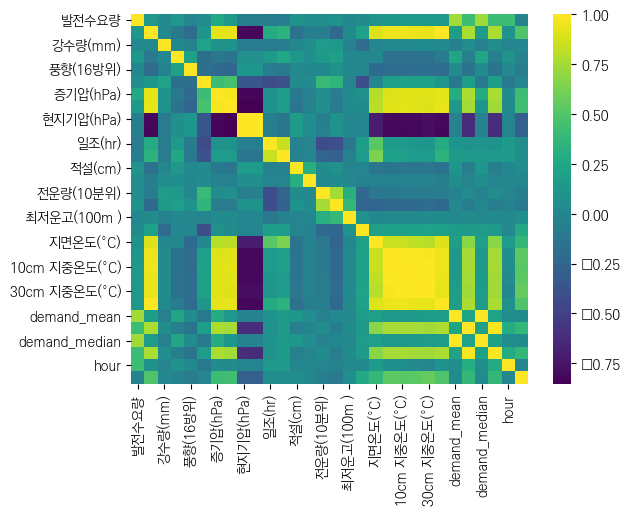

In [12]:
# 히트맵
corr = temp_demand.iloc[:, 1:].corr()
sns.heatmap(corr, annot=False, cmap="viridis")


In [17]:
df_core = temp_demand[['발전수요량', 'month', 'hour', '기온(°C)', '일사(MJ/m2)', 'temp_group']]
df_core.describe()

,발전수요량,month,hour,기온(°C),일사(MJ/m2),temp_group
count,1.533300e+04,15333.000000,15333.000000,15333.000000,15333.000000,15333.000000
mean,7.364595e+05,5.874649,11.499837,18.245399,0.577393,1.352182
std,1.322486e+05,3.195629,6.923020,8.474156,0.935944,1.111634
min,4.648360e+05,1.000000,0.000000,-3.100000,0.000000,0.000000
25%,6.343100e+05,3.000000,5.000000,11.000000,0.000000,0.000000
50%,7.197290e+05,6.000000,11.000000,18.400000,0.000000,1.000000
75%,8.214070e+05,8.000000,18.000000,25.700000,0.830000,2.000000
max,1.178631e+06,12.000000,23.000000,37.000000,3.830000,3.000000


In [57]:
df_core.info()

<class 'pandas.core.frame.DataFrame'>
Index: 15333 entries, 0 to 15335
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   발전수요량      15333 non-null  float64
 1   month      15333 non-null  int32  
 2   hour       15333 non-null  int32  
 3   기온(°C)     15333 non-null  float64
 4   일사(MJ/m2)  15333 non-null  float64
dtypes: float64(3), int32(2)
memory usage: 598.9 KB


In [14]:
# X:hour Y:Demand hue:month
# 스케일조정 (수요량, 기온, 일사)
cols = df_core.columns[[0, 3, 4]]
for col in cols:
    df_core[col] = (df_core[col] - df_core[col].min()) / (df_core[col].max() - df_core[col].min())
df_core.describe()
    

C:\Users\praye\AppData\Local\Temp\ipykernel_24188\3555001940.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_core[col] = (df_core[col] - df_core[col].min()) / (df_core[col].max() - df_core[col].min())


,발전수요량,month,hour,기온(°C),일사(MJ/m2)
count,15333.000000,15333.000000,15333.000000,15333.000000,15333.000000
mean,0.380534,5.874649,11.499837,0.532304,0.150755
std,0.185275,3.195629,6.923020,0.211326,0.244372
min,0.000000,1.000000,0.000000,0.000000,0.000000
25%,0.237427,3.000000,5.000000,0.351621,0.000000
50%,0.357096,6.000000,11.000000,0.536160,0.000000
75%,0.499543,8.000000,18.000000,0.718204,0.216710
max,1.000000,12.000000,23.000000,1.000000,1.000000


C:\Users\praye\AppData\Local\Temp\ipykernel_82348\1650352965.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(10,6))
c:\Users\praye\anaconda3\envs\kdt_energy1_1\Lib\site-packages\IPython\core\events.py:82: UserWarning: Glyph 48156 (\N{HANGUL SYLLABLE BAL}) missing from font(s) Arial.
  func(*args, **kwargs)
c:\Users\praye\anaconda3\envs\kdt_energy1_1\Lib\site-packages\IPython\core\events.py:82: UserWarning: Glyph 51204 (\N{HANGUL SYLLABLE JEON}) missing from font(s) Arial.
  func(*args, **kwargs)
c:\Users\praye\anaconda3\envs\kdt_energy1_1\Lib\site-packages\IPython\core\events.py:82: UserWarning: Glyph 49688 (\N{HANGUL SYLLABLE SU}) missing from font(s) Arial.
  func(*args, **kwargs)
c:\Users\praye\

<Figure size 1000x600 with 0 Axes>

c:\Users\praye\anaconda3\envs\kdt_energy1_1\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 48156 (\N{HANGUL SYLLABLE BAL}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\praye\anaconda3\envs\kdt_energy1_1\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 51204 (\N{HANGUL SYLLABLE JEON}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\praye\anaconda3\envs\kdt_energy1_1\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 49688 (\N{HANGUL SYLLABLE SU}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\praye\anaconda3\envs\kdt_energy1_1\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 50836 (\N{HANGUL SYLLABLE YO}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\praye\anaconda3\envs\kdt_energy1_1\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 47049 (\N{HANGUL SYLLABLE RY

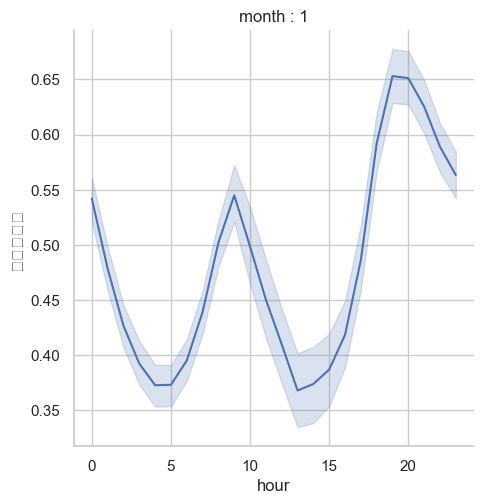

c:\Users\praye\anaconda3\envs\kdt_energy1_1\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 44592 (\N{HANGUL SYLLABLE GI}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\praye\anaconda3\envs\kdt_energy1_1\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 50728 (\N{HANGUL SYLLABLE ON}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


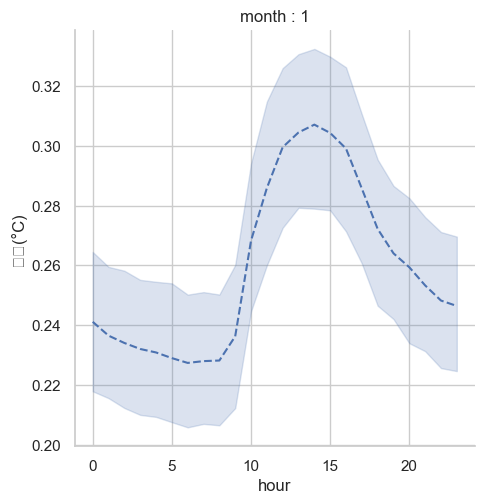

c:\Users\praye\anaconda3\envs\kdt_energy1_1\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 51068 (\N{HANGUL SYLLABLE IL}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\praye\anaconda3\envs\kdt_energy1_1\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 49324 (\N{HANGUL SYLLABLE SA}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


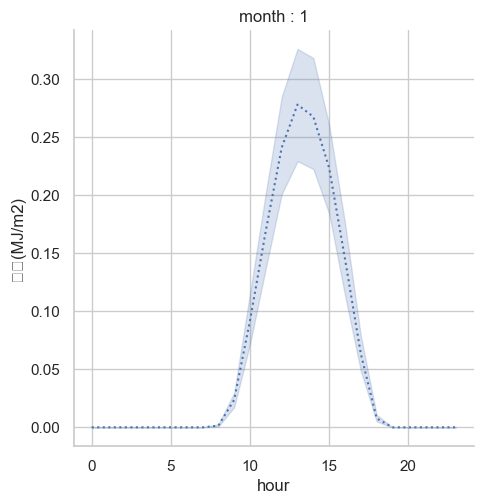

<Figure size 1000x600 with 0 Axes>

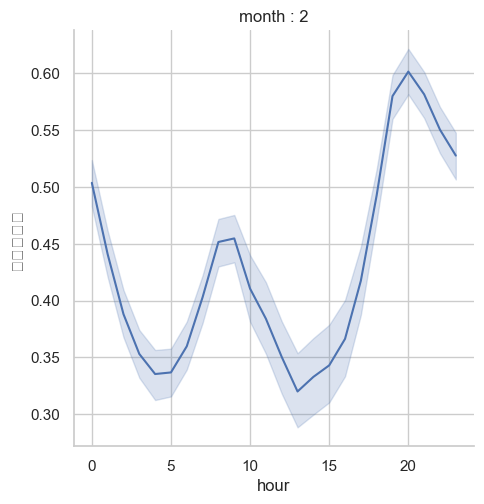

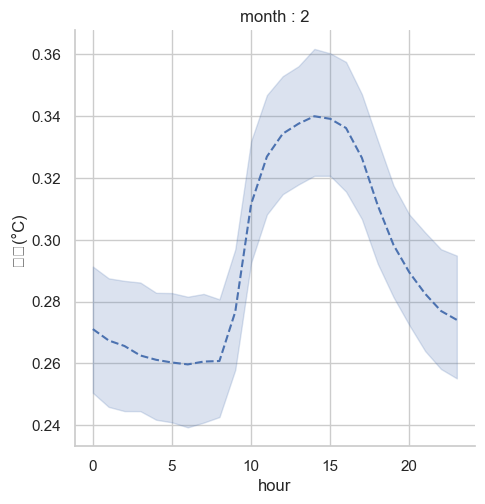

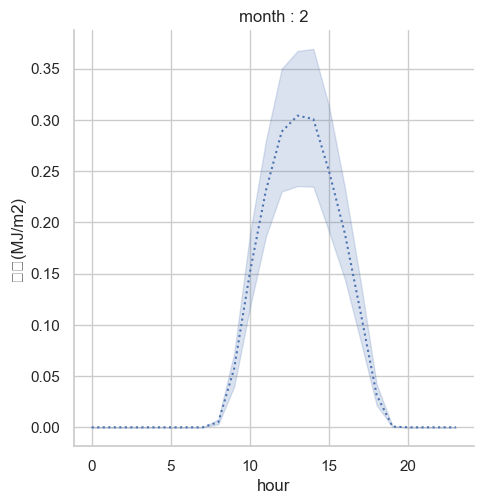

<Figure size 1000x600 with 0 Axes>

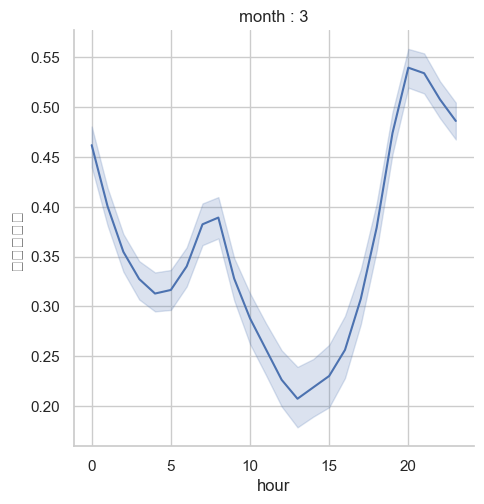

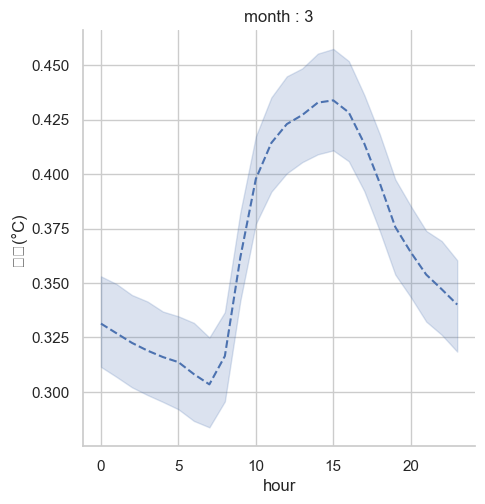

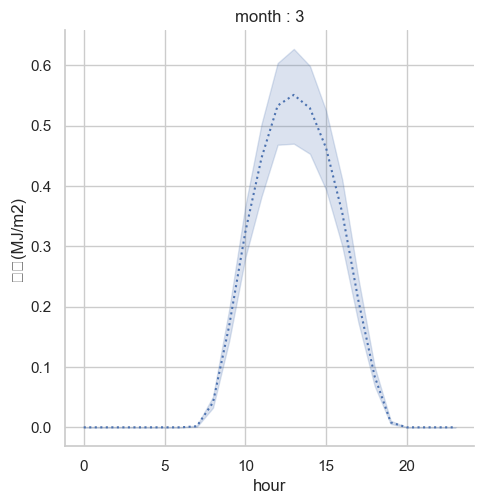

<Figure size 1000x600 with 0 Axes>

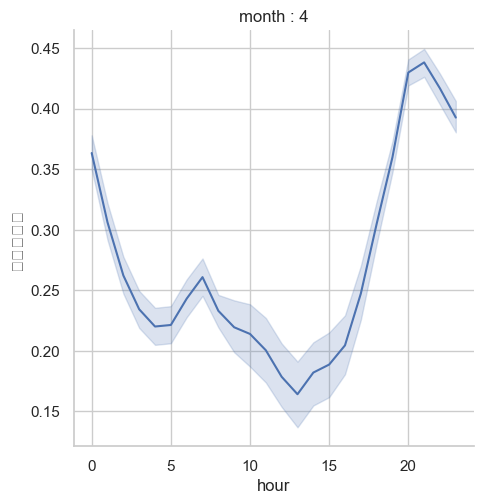

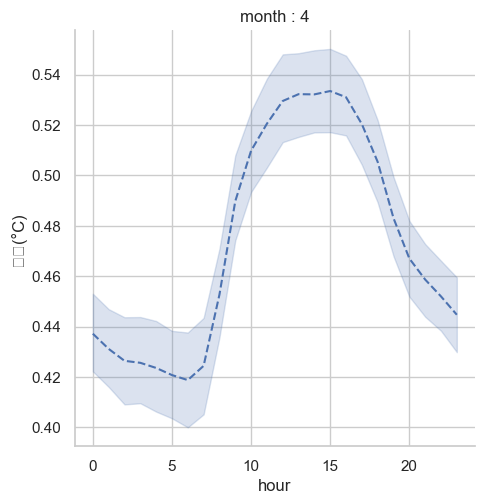

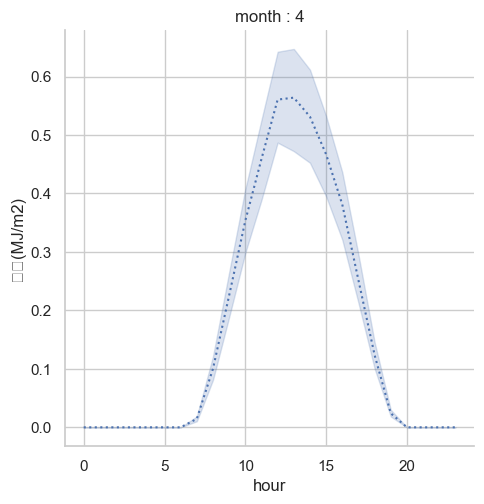

<Figure size 1000x600 with 0 Axes>

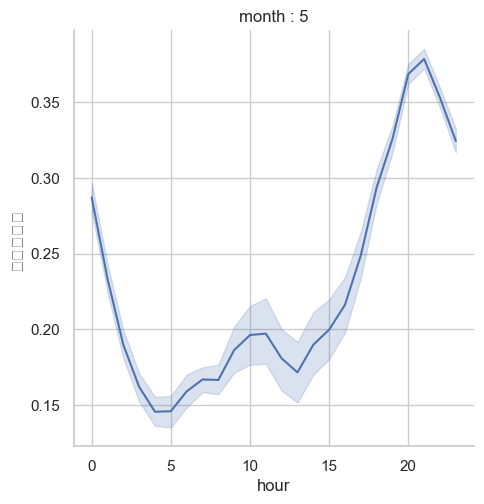

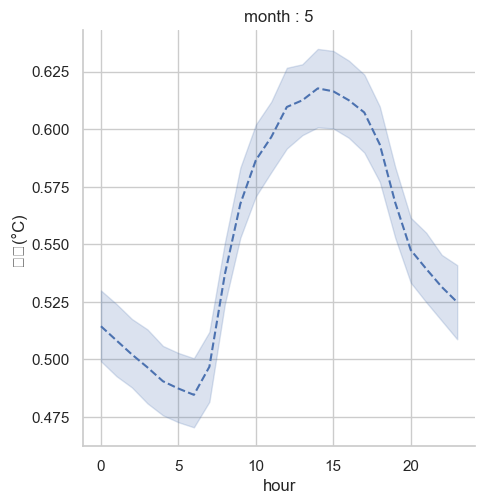

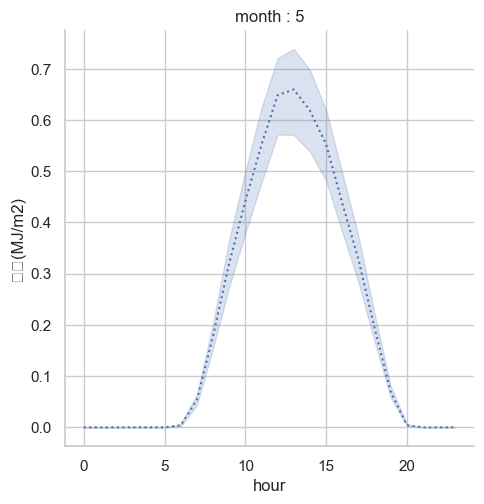

<Figure size 1000x600 with 0 Axes>

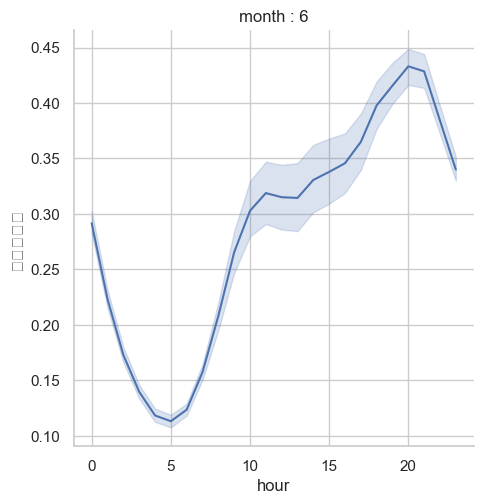

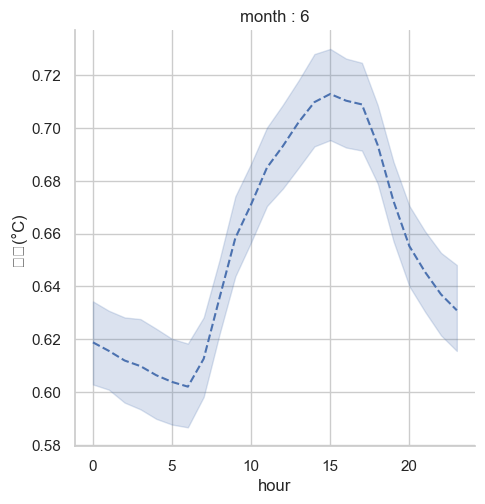

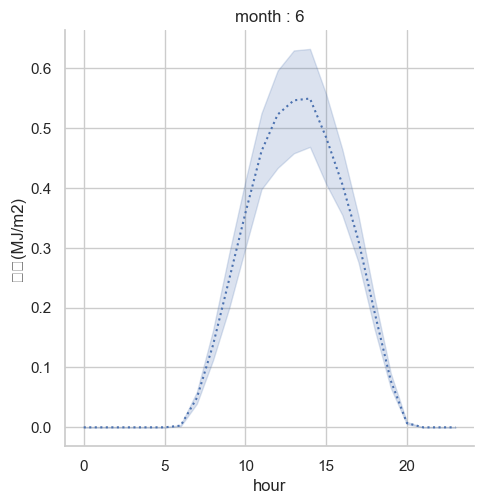

<Figure size 1000x600 with 0 Axes>

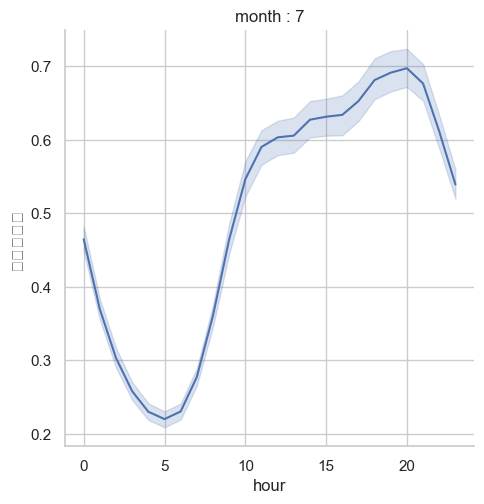

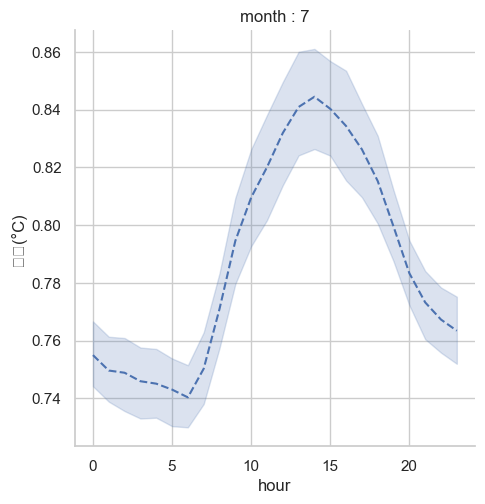

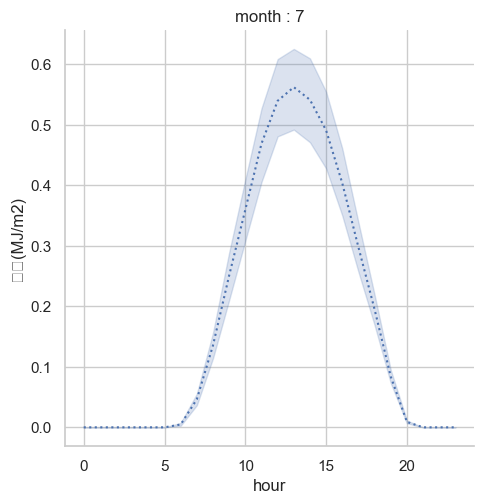

<Figure size 1000x600 with 0 Axes>

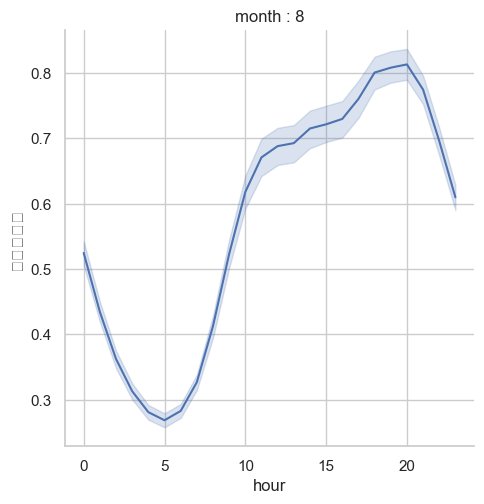

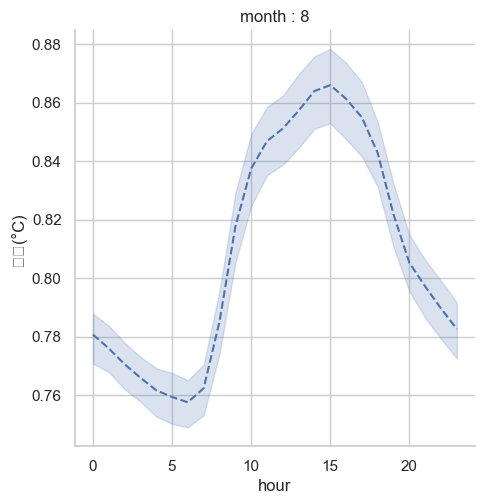

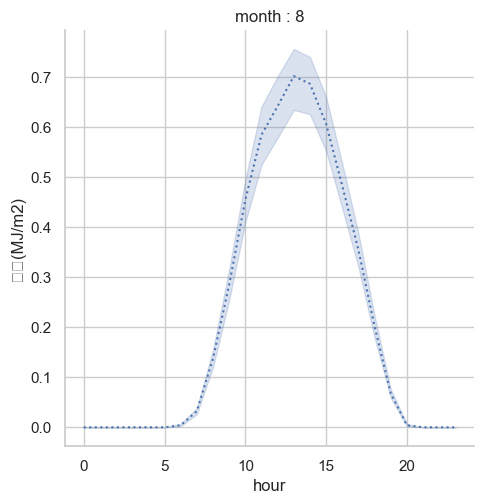

<Figure size 1000x600 with 0 Axes>

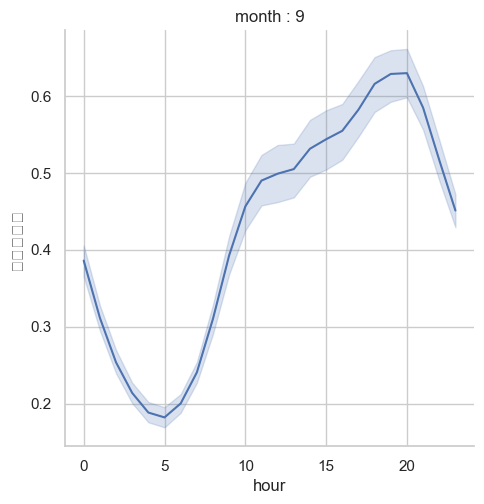

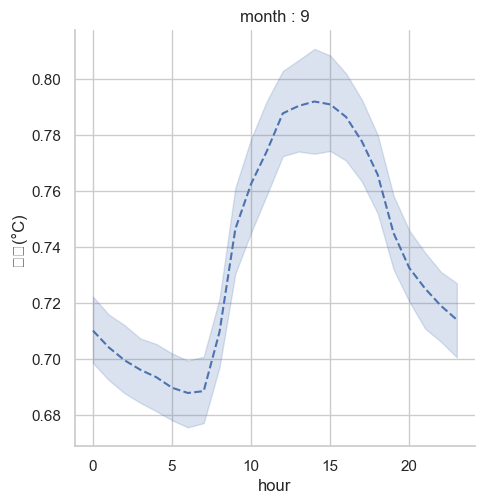

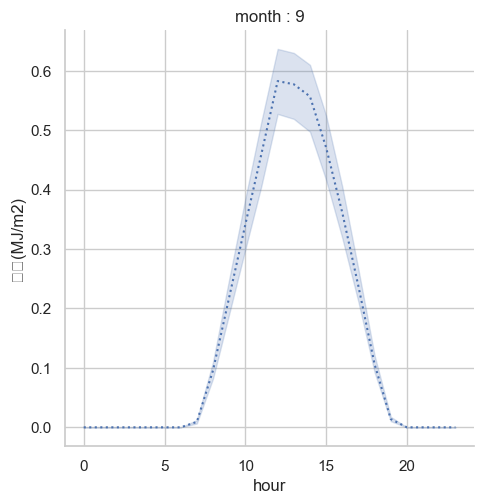

<Figure size 1000x600 with 0 Axes>

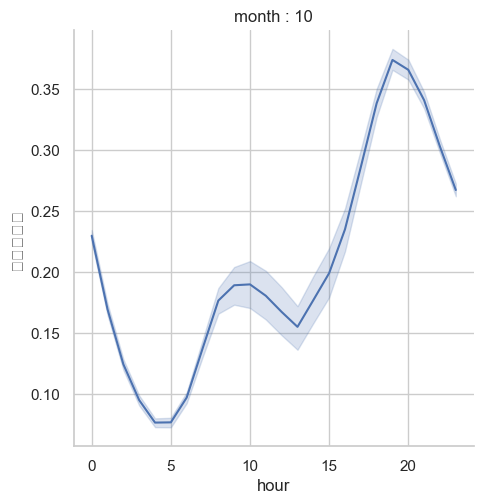

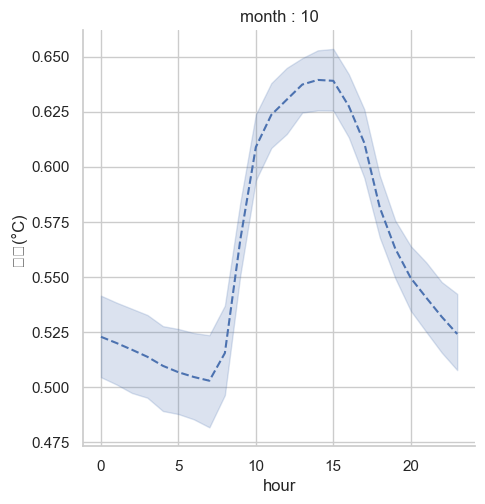

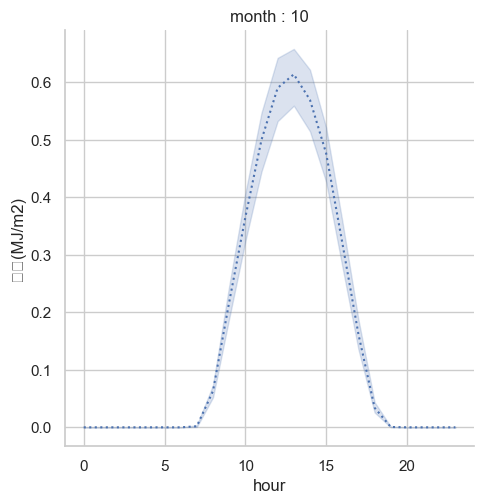

<Figure size 1000x600 with 0 Axes>

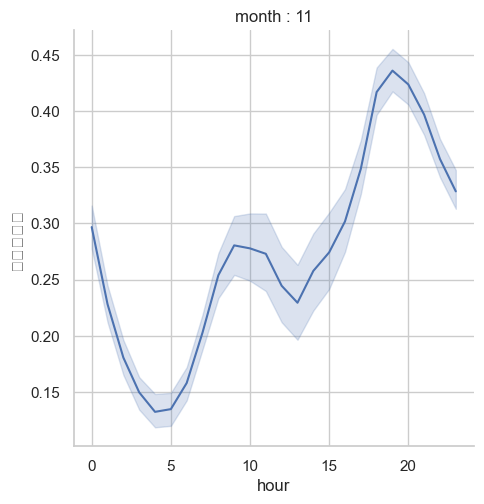

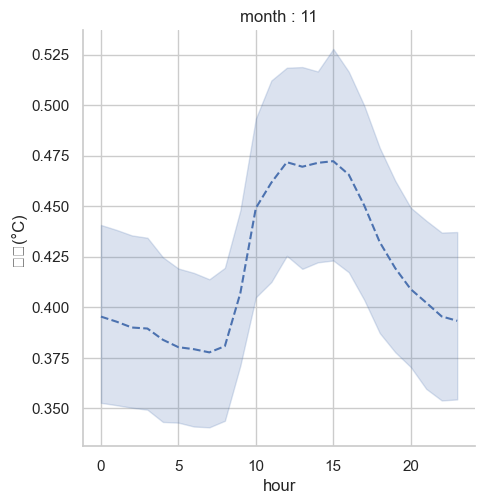

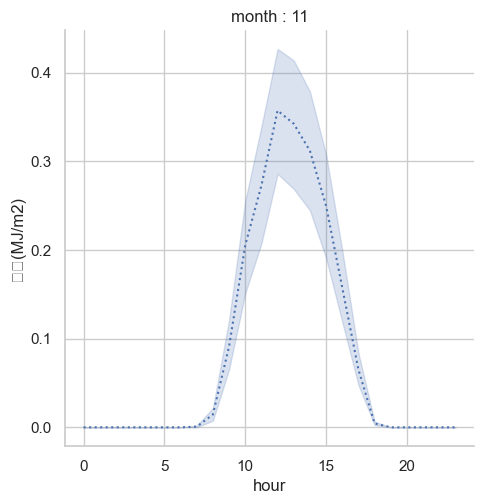

<Figure size 1000x600 with 0 Axes>

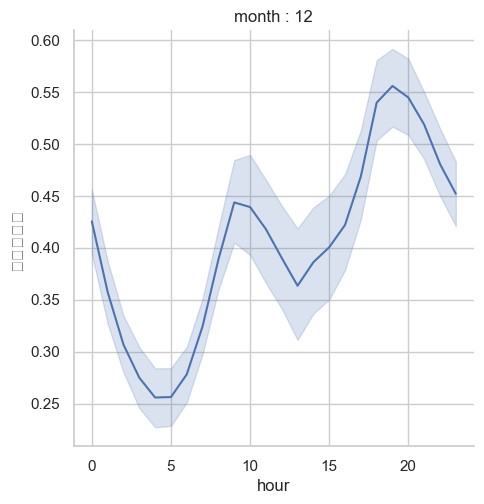

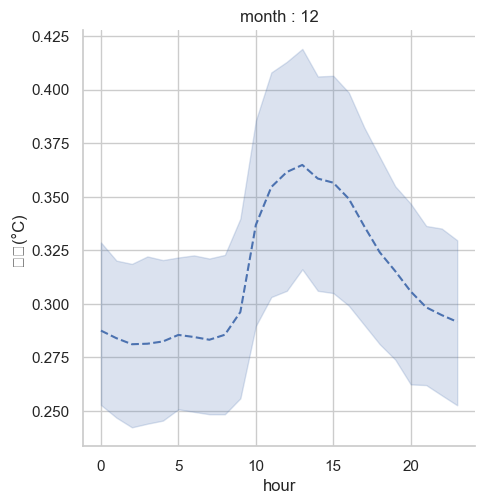

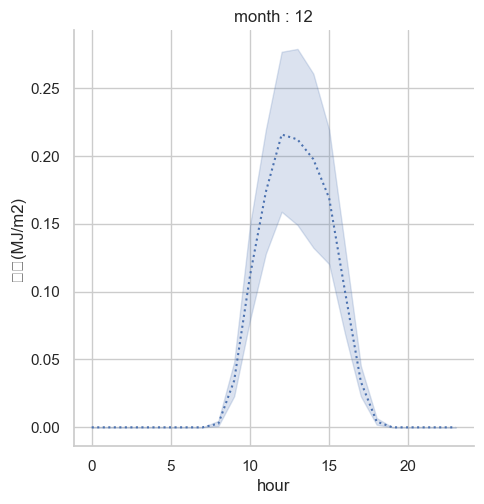

In [68]:
# 월별 & 시간별 발전수요량/기온/일사량 차트
for i in range(1,13):
    df=df_core[df_core['month']==i]
    plt.figure(figsize=(10,6))
    sns.relplot(x='hour', y='발전수요량',  data=df, kind='line', label='Demand')
    plt.title(f'month : {i}')
    sns.relplot(x='hour', y='기온(°C)',    data=df, kind='line', label='Temperature', linestyle='--')
    plt.title(f'month : {i}')
    sns.relplot(x='hour', y='일사(MJ/m2)', data=df, kind='line', label='Solar', linestyle=':')
    plt.title(f'month : {i}')




<Figure size 1000x600 with 0 Axes>

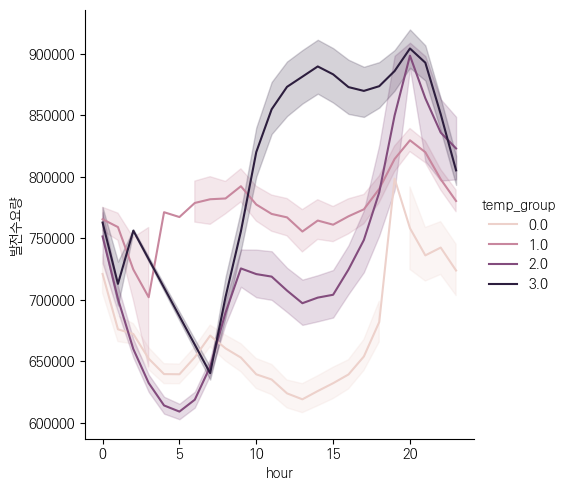

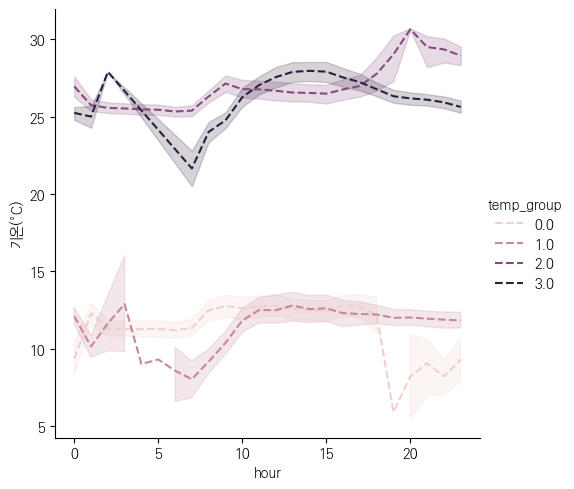

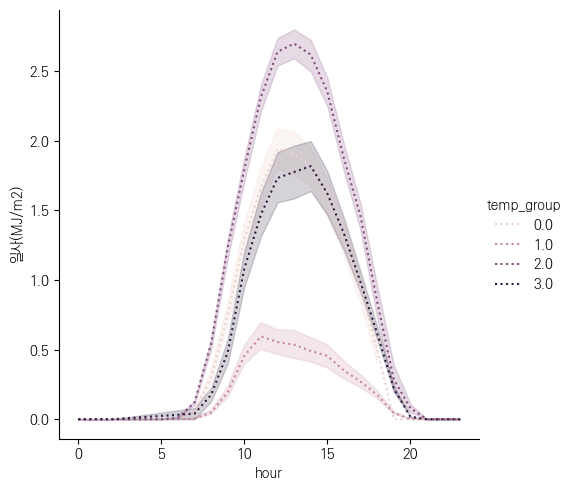

In [19]:
# 월별 & 시간별 발전수요량/기온/일사량 차트
plt.figure(figsize=(10,6))
sns.relplot(x='hour', y='발전수요량',  hue='temp_group', data=df_core, kind='line', label='Demand')
# plt.ylim(-0.1, 1.1)
sns.relplot(x='hour', y='기온(°C)',    hue='temp_group', data=df_core, kind='line', label='Temperature', linestyle='--')
# plt.ylim(-0.1, 1.1)
sns.relplot(x='hour', y='일사(MJ/m2)', hue='temp_group', data=df_core, kind='line', label='Solar', linestyle=':')
# plt.ylim(-0.1, 1.1)


c:\Users\praye\anaconda3\envs\kdt_energy1_1\Lib\site-packages\seaborn\axisgrid.py:123: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from font(s) KoPubDotum Light.
  self._figure.tight_layout(*args, **kwargs)
c:\Users\praye\anaconda3\envs\kdt_energy1_1\Lib\site-packages\seaborn\utils.py:61: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from font(s) KoPubDotum Light.
  fig.canvas.draw()
c:\Users\praye\anaconda3\envs\kdt_energy1_1\Lib\site-packages\seaborn\axisgrid.py:123: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from font(s) KoPubDotum Light.
  self._figure.tight_layout(*args, **kwargs)
c:\Users\praye\anaconda3\envs\kdt_energy1_1\Lib\site-packages\IPython\core\events.py:82: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from font(s) KoPubDotum Light.
  func(*args, **kwargs)
c:\Users\praye\anaconda3\envs\kdt_energy1_1\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from font(s) KoPubDotum Light.
  fig.canvas.print_figure(

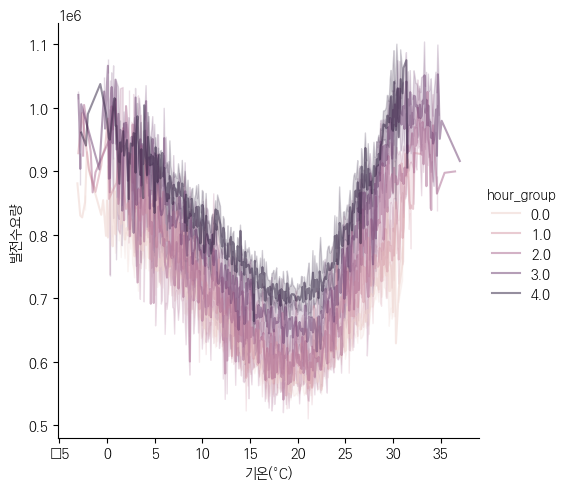

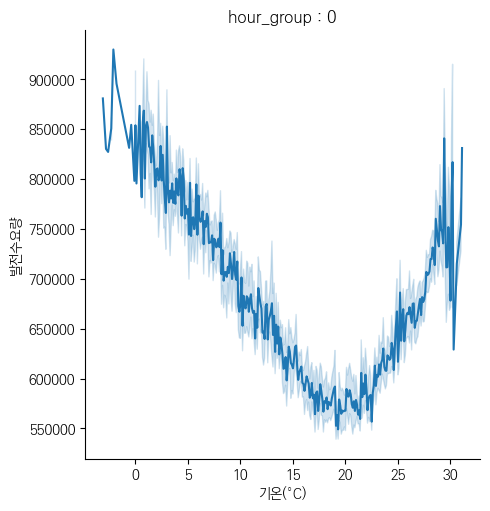

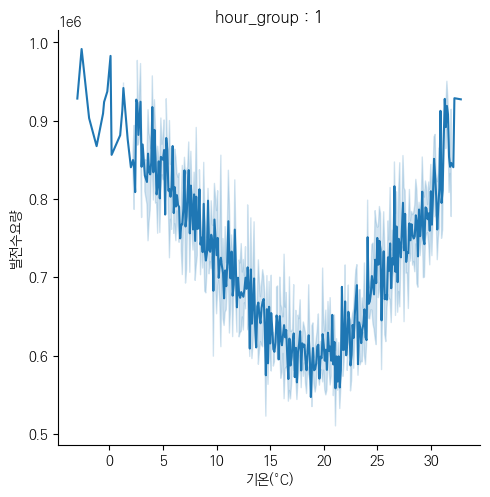

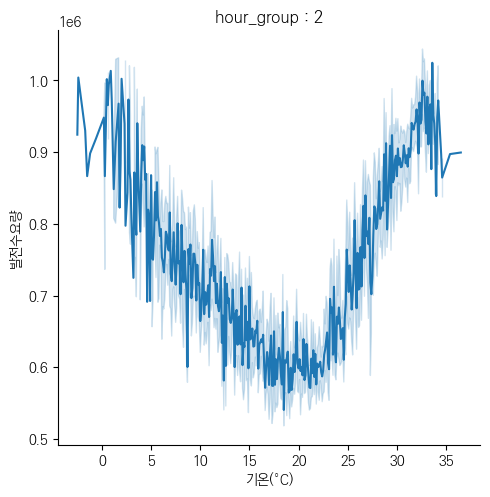

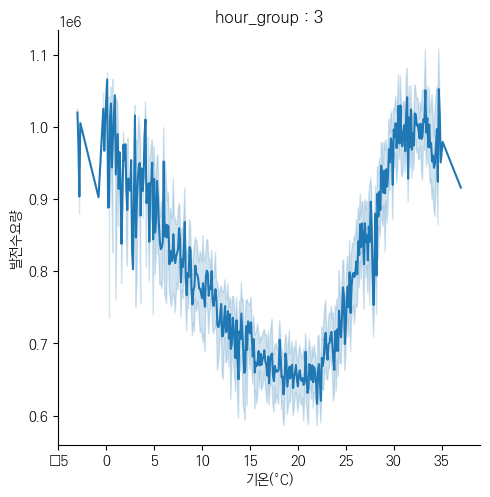

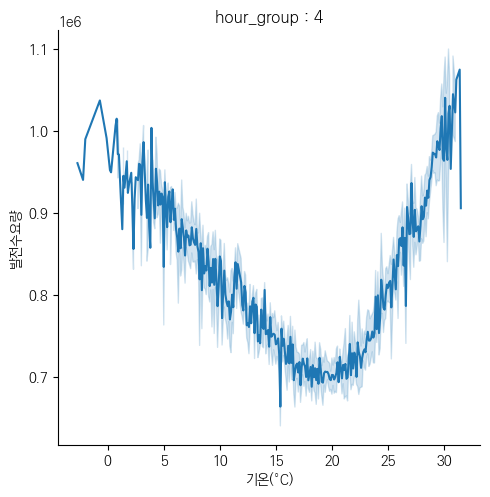

In [51]:
sns.relplot(x='기온(°C)', y='발전수요량',    hue='hour_group', data=temp_demand[cols], kind='line', alpha=0.5, label='Temperature')
for i in [0, 1, 2, 3, 4]:
    df = temp_demand[temp_demand['hour_group']==i]
    sns.relplot(x='기온(°C)', y='발전수요량', data=df, kind='line')
    plt.title(f'hour_group : {i}')
    


In [ ]:
sns.relplot(x='hour', y='발전수요량', hue='temp_group', data=temp_demand, kind='line')

c:\Users\praye\anaconda3\envs\kdt_energy1_1\Lib\site-packages\seaborn\utils.py:61: UserWarning: Glyph 48156 (\N{HANGUL SYLLABLE BAL}) missing from font(s) Arial.
  fig.canvas.draw()
c:\Users\praye\anaconda3\envs\kdt_energy1_1\Lib\site-packages\seaborn\utils.py:61: UserWarning: Glyph 51204 (\N{HANGUL SYLLABLE JEON}) missing from font(s) Arial.
  fig.canvas.draw()
c:\Users\praye\anaconda3\envs\kdt_energy1_1\Lib\site-packages\seaborn\utils.py:61: UserWarning: Glyph 49688 (\N{HANGUL SYLLABLE SU}) missing from font(s) Arial.
  fig.canvas.draw()
c:\Users\praye\anaconda3\envs\kdt_energy1_1\Lib\site-packages\seaborn\utils.py:61: UserWarning: Glyph 50836 (\N{HANGUL SYLLABLE YO}) missing from font(s) Arial.
  fig.canvas.draw()
c:\Users\praye\anaconda3\envs\kdt_energy1_1\Lib\site-packages\seaborn\utils.py:61: UserWarning: Glyph 47049 (\N{HANGUL SYLLABLE RYANG}) missing from font(s) Arial.
  fig.canvas.draw()
c:\Users\praye\anaconda3\envs\kdt_energy1_1\Lib\site-packages\seaborn\utils.py:61: UserWa

c:\Users\praye\anaconda3\envs\kdt_energy1_1\Lib\site-packages\IPython\core\events.py:82: UserWarning: Glyph 48156 (\N{HANGUL SYLLABLE BAL}) missing from font(s) Arial.
  func(*args, **kwargs)
c:\Users\praye\anaconda3\envs\kdt_energy1_1\Lib\site-packages\IPython\core\events.py:82: UserWarning: Glyph 51204 (\N{HANGUL SYLLABLE JEON}) missing from font(s) Arial.
  func(*args, **kwargs)
c:\Users\praye\anaconda3\envs\kdt_energy1_1\Lib\site-packages\IPython\core\events.py:82: UserWarning: Glyph 49688 (\N{HANGUL SYLLABLE SU}) missing from font(s) Arial.
  func(*args, **kwargs)
c:\Users\praye\anaconda3\envs\kdt_energy1_1\Lib\site-packages\IPython\core\events.py:82: UserWarning: Glyph 50836 (\N{HANGUL SYLLABLE YO}) missing from font(s) Arial.
  func(*args, **kwargs)
c:\Users\praye\anaconda3\envs\kdt_energy1_1\Lib\site-packages\IPython\core\events.py:82: UserWarning: Glyph 47049 (\N{HANGUL SYLLABLE RYANG}) missing from font(s) Arial.
  func(*args, **kwargs)
c:\Users\praye\anaconda3\envs\kdt_energ

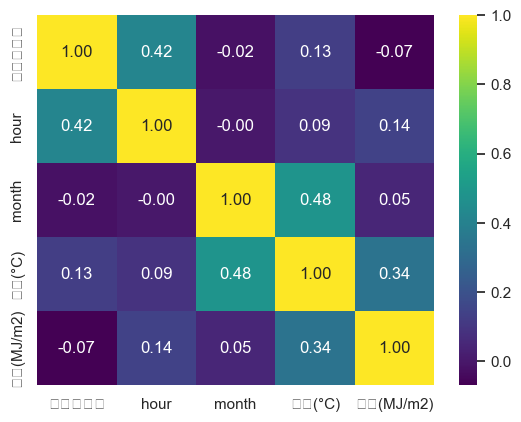

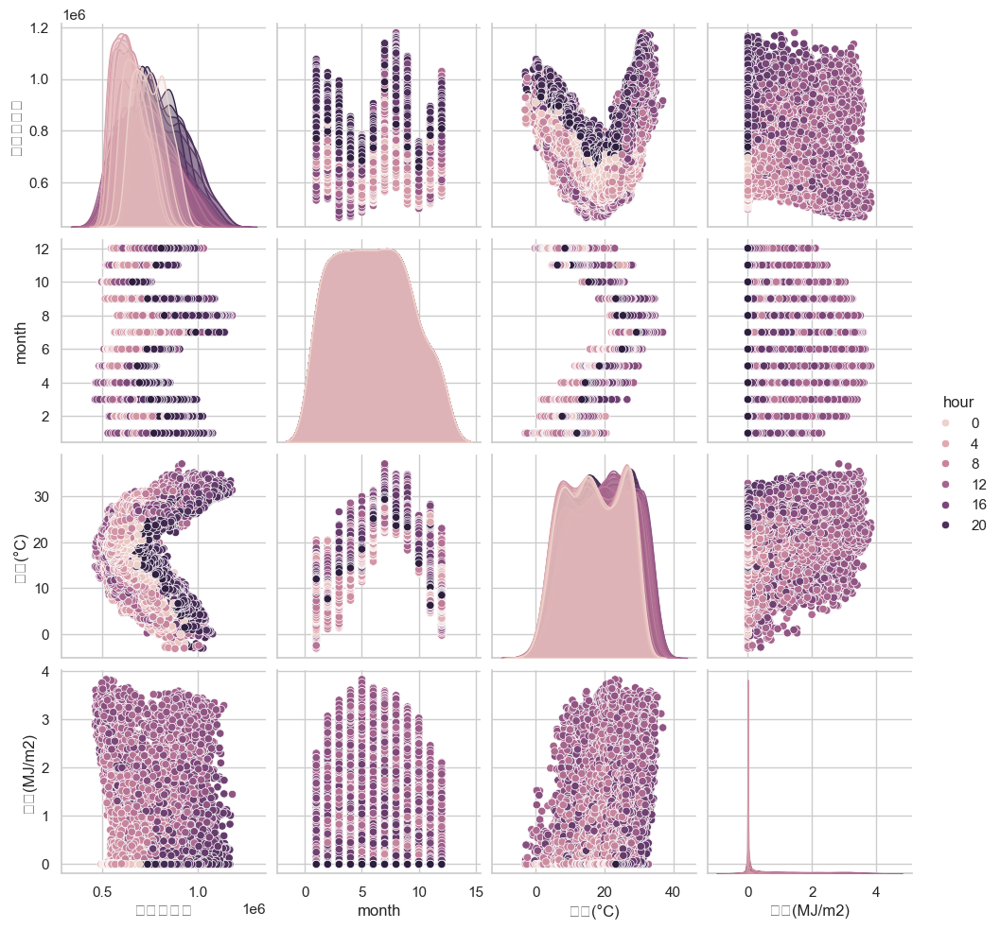

In [47]:
# 월/시간/온도/일사량
df_core = temp_demand[['발전수요량', 'hour', 'month', '기온(°C)', '일사(MJ/m2)']]
corr_2 = df_core.corr()
sns.set_theme(style='whitegrid')
sns.heatmap(corr_2, annot=True, cmap="viridis", fmt='.2f')
sns.pairplot(df_core, hue='hour')

c:\Users\praye\anaconda3\envs\kdt_energy1_1\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 49884 (\N{HANGUL SYLLABLE SI}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\praye\anaconda3\envs\kdt_energy1_1\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 44036 (\N{HANGUL SYLLABLE GAN}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\praye\anaconda3\envs\kdt_energy1_1\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 44050 (\N{HANGUL SYLLABLE GABS}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\praye\anaconda3\envs\kdt_energy1_1\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 48324 (\N{HANGUL SYLLABLE BYEOL}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\praye\anaconda3\envs\kdt_energy1_1\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 49688 (\N{HANGUL SYLLABLE

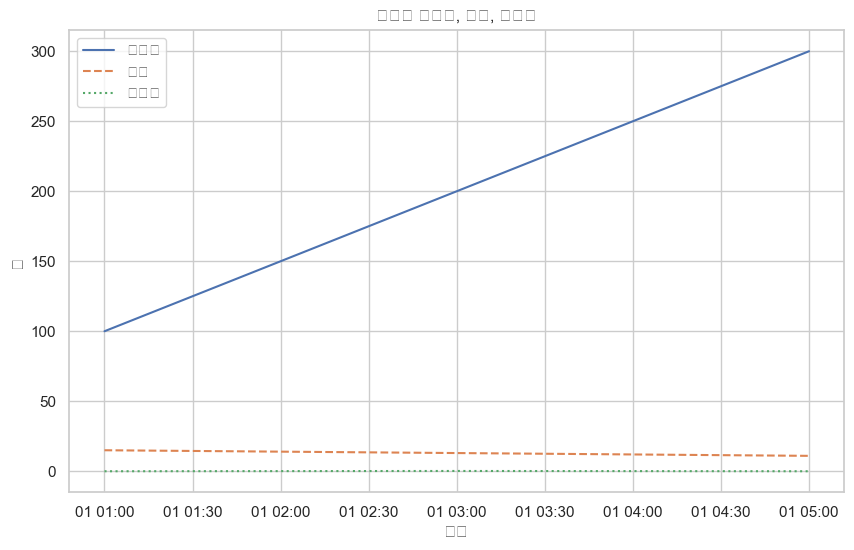

In [53]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# 예제 데이터 생성
data = {
    '시간': ['01:00', '02:00', '03:00', '04:00', '05:00'],
    '수요량': [100, 150, 200, 250, 300],
    '온도': [15, 14, 13, 12, 11],
    '일사량': [0, 0.1, 0.2, 0.1, 0]
}
df = pd.DataFrame(data)

# 시간 열을 datetime 형식으로 변환
df['시간'] = pd.to_datetime(df['시간'], format='%H:%M')

# 꺾은선 그래프 그리기
plt.figure(figsize=(10, 6))
sns.lineplot(x='시간', y='수요량', data=df, label='수요량')
sns.lineplot(x='시간', y='온도', data=df, label='온도', linestyle='--')
sns.lineplot(x='시간', y='일사량', data=df, label='일사량', linestyle=':')

# 그래프 제목과 레이블 설정
plt.title('시간별 수요량, 온도, 일사량')
plt.xlabel('시간')
plt.ylabel('값')
plt.legend()

# 그래프 표시
plt.show()
